# Feature Engineering Notebook
# Objectives
* Engineer features for Regression and Cluster models

### Inputs
* outputs/datasets/cleaned/TrainSetCleaned.csv
* outputs/datasets/cleaned/TestSetCleaned.csv
### Outputs
* generate a list with variables to engineer

## Conclusions from feature engineering analysis
Based on the transformations applied to each variable, we can draw conclusions on their effectiveness:

* **KitchenQual**: This is the only categorical variable that is relevant to my analysis. I observed that the encoding assigned could be improved to resemble linearity and improve predictability for this feature. The encoding assigned ordinal values as follows:

**0 => TA**

**1 => Gd**

**2 => Fa**

**3 => Ex**


I would explore given more time how to apply instead the following encoding: 

**0 => Po**

**1 => Fa**

**2 => TA**

**3 => Gd**

**4 => Ex**

* **OverallQual**: Of the applied transformations reciprocal and logarithmic ones appear to increase skewness and are not recommended. For the other transformations their affects are bearly noticable with the exception of the power transformation. This transformation appears to improve matters slightly. The non-transformed data displays a more gaussian distribution for this variable than for other variables. This is good because OverallQual seems to be the most important variable in the dataset. Lastly, it is clear that the reciprocal transformation yields negative results for this variable which would be an undesired effect. The final recommendation for this feature is to apply the power transformation.

* **GrLivArea**: Most of the transformations applied seem to decrease the skewness of the variable, resulting in a more Gaussian distribution. In contrast, both the power transformation and the reciprocal transformation display increased skewness and poor transformation in the plots. For this feature it is recommended either a log10 or a log_e transformation; I decided to apply log10.

* **GarageArea**: Both of the applied transformations do seem to decrease the skewness of the variable, resulting in a more Gaussian distribution. However, the yeo_johnson transformation tields the best results and we will seek to apply this one. 

* **Outliers**: For both GrLivArea and GarageArea it can be appreciated a number of outliers found in the dataset. Although logarithmic transformations will mitigate there negative effect, given more time we should consider addressing them directly in the dataset by either capping their value (assigning a maximum value based on multiples of standard deviation above the mean, for example) or removing those records all together from the dataset.

# Change working directory

We need to change the working directory from its current folder to its parent folder

  * We access the current directory with os.getcwd()

In [1]:
import os
current_dir = os.getcwd()
current_dir

'C:\\Users\\issam\\Housing-market-analysis.1\\jupyter_notebooks'

In [2]:
os.chdir(os.path.dirname(current_dir))
print("You set a new current directory")

You set a new current directory


In [3]:
current_dir = os.getcwd()
current_dir

'C:\\Users\\issam\\Housing-market-analysis.1'

## Load Cleaned Data
Train Set

In [4]:
import pandas as pd
TrainSet = pd.read_csv("outputs/datasets/cleaned/TrainSetCleaned.csv")
print(TrainSet.columns)
TrainSet.head() 

Index(['1stFlrSF', '2ndFlrSF', 'BedroomAbvGr', 'BsmtExposure', 'BsmtFinSF1',
       'BsmtFinType1', 'BsmtUnfSF', 'GarageArea', 'GarageFinish',
       'GarageYrBlt', 'GrLivArea', 'KitchenQual', 'LotArea', 'LotFrontage',
       'MasVnrArea', 'OpenPorchSF', 'OverallCond', 'OverallQual',
       'TotalBsmtSF', 'YearBuilt', 'YearRemodAdd', 'SalePrice'],
      dtype='object')


,1stFlrSF,2ndFlrSF,BedroomAbvGr,BsmtExposure,BsmtFinSF1,BsmtFinType1,BsmtUnfSF,GarageArea,GarageFinish,GarageYrBlt,...,LotArea,LotFrontage,MasVnrArea,OpenPorchSF,OverallCond,OverallQual,TotalBsmtSF,YearBuilt,YearRemodAdd,SalePrice
0,2158,0.0,4.000000,Av,477,ALQ,725,576,Unf,1950.0,...,12615,84.000000,0.0,29,7,6,1202,1950,2001,243000
1,1614,0.0,3.000000,Av,20,GLQ,1594,865,RFn,2005.0,...,11210,86.000000,240.0,59,5,7,1614,2005,2006,221500
2,810,672.0,2.873045,No,156,BLQ,516,400,Unf,1934.0,...,12155,70.243187,0.0,0,8,6,672,1925,1950,140000
3,894,0.0,3.000000,No,492,BLQ,402,450,Non,1968.0,...,8724,109.000000,0.0,0,5,5,894,1968,1968,129000
4,864,0.0,3.000000,No,0,Unf,864,280,Non,1972.0,...,9353,71.000000,0.0,0,5,4,864,1970,1970,116050


Test Set

In [42]:
TestSet = pd.read_csv("outputs/datasets/cleaned/TestSetCleaned.csv")
print(len(TestSet))
print(TestSet.columns)
TestSet.head()

FileNotFoundError: [Errno 2] No such file or directory: 'outputs/datasets/cleaned/TestSetCleaned.csv'

## Data Exploration

In [6]:
from ydata_profiling import ProfileReport
pandas_report = ProfileReport(df=TrainSet, minimal=True)
pandas_report.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Feature Engineering

### Custom function

In [7]:
from feature_engine import transformation as vt
from feature_engine.outliers import Winsorizer
from feature_engine.encoding import OrdinalEncoder
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from IPython.display import Image, display
sns.set(style="whitegrid")
import warnings
warnings.filterwarnings('ignore')



def FeatureEngineeringAnalysis(df,analysis_type=None):


  """
  - Used for quick feature engineering on numerical and categorical variables
  to decide which transformation can better transform the distribution shape 
  - Once transformed, use a reporting tool, like pandas-profiling, to evaluate distributions

  """
  check_missing_values(df)
  allowed_types = ['numerical', 'ordinal_encoder', 'outlier_winsorizer']
  check_user_entry_on_analysis_type(analysis_type, allowed_types)
  list_column_transformers = define_list_column_transformers(analysis_type)
  
  
  # Loop over each variable and engineer the data according to the analysis type
  df_feat_eng = pd.DataFrame([])
  for column in df.columns:
    # create additional columns (column_method) to apply the methods
    df_feat_eng = pd.concat([df_feat_eng, df[column]], axis=1)
    for method in list_column_transformers:
      df_feat_eng[f"{column}_{method}"] = df[column]
      
    # Apply transformers in respectives column_transformers
    df_feat_eng, list_applied_transformers = apply_transformers(analysis_type, df_feat_eng, column)

    # For each variable, assess how the transformations perform
    transformer_evaluation(column, list_applied_transformers, analysis_type, df_feat_eng)

  return df_feat_eng


def check_user_entry_on_analysis_type(analysis_type, allowed_types):
  ### Check analyis type
  if analysis_type == None:
    raise SystemExit(
      f"You should pass analysis_type parameter as one of the following options: {allowed_types}")
  if analysis_type not in allowed_types:
      raise SystemExit(
        f"analysis_type argument should be one of these options: {allowed_types}")

def check_missing_values(df):
  if df.isna().sum().sum() != 0:
    raise SystemExit(
        f"There is missing values in your dataset. Please handle that before getting into feature engineering.")



def define_list_column_transformers(analysis_type):
  ### Set suffix colummns acording to analysis_type
  if analysis_type=='numerical':
    list_column_transformers = ["log_e", "log_10", "reciprocal", "power", "box_cox", "yeo_johnson"]
  
  elif analysis_type=='ordinal_encoder':
    list_column_transformers = ["ordinal_encoder", "ordinal_encoder_ordered"] # Adding specific order encoder to explore impact in KitchenQual
    #list_column_transformers = ["ordinal_encoder"]

  elif analysis_type=='outlier_winsorizer':
    list_column_transformers = ['iqr']

  return list_column_transformers



def apply_transformers(analysis_type, df_feat_eng, column):


  for col in df_feat_eng.select_dtypes(include='category').columns:
    df_feat_eng[col] = df_feat_eng[col].astype('object')


  if analysis_type=='numerical':
    df_feat_eng, list_applied_transformers = FeatEngineering_Numerical(df_feat_eng, column)
  
  elif analysis_type=='outlier_winsorizer':
    df_feat_eng, list_applied_transformers = FeatEngineering_OutlierWinsorizer(df_feat_eng, column)

  elif analysis_type=='ordinal_encoder':
    df_feat_eng, list_applied_transformers = FeatEngineering_CategoricalEncoder(df_feat_eng, column)

  return df_feat_eng, list_applied_transformers


def transformer_evaluation(column, list_applied_transformers, analysis_type, df_feat_eng):
  # For each variable, assess how the transformations perform
  print(f"* Variable Analyzed: {column}")
  print(f"* Applied transformation: {list_applied_transformers} \n")
  for col in [column] + list_applied_transformers:
    
    if analysis_type != 'ordinal_encoder':
      DiagnosticPlots_Numerical(df_feat_eng, col)
    
    else:
      if col == column: 
        DiagnosticPlots_Categories(df_feat_eng, col)
      else:
        DiagnosticPlots_Numerical(df_feat_eng, col)

    print("\n")


def DiagnosticPlots_Categories(df_feat_eng, col):
  plt.figure(figsize=(20, 5))
  sns.countplot(data=df_feat_eng, x=col, palette=['#432371'], order = df_feat_eng[col].value_counts().index)
  plt.xticks(rotation=90) 
  plt.suptitle(f"{col}", fontsize=30, y=1.0)        
  #plt.show();
  plt.savefig('DiagnosticPlots_Categories.png')
  numerical_image = Image('DiagnosticPlots_Categories.png')
  display(numerical_image)  
  print("\n")


def DiagnosticPlots_Numerical(df, variable):
  fig, axes = plt.subplots(1, 3, figsize=(20, 8))
  sns.histplot(data=df, x=variable, kde=True, element="step", ax=axes[0]) 
  stats.probplot(df[variable], dist="norm", plot=axes[1])
  sns.boxplot(x=df[variable], ax=axes[2])
  
  axes[0].set_title('Histogram')
  axes[1].set_title('QQ Plot')
  axes[2].set_title('Boxplot')
  fig.suptitle(f"{variable}", fontsize=30, y=1.0)
  #plt.show();
  plt.savefig('DiagnosticPlots_Numerical.png')
  numerical_image = Image('DiagnosticPlots_Numerical.png')
  display(numerical_image) 


def FeatEngineering_CategoricalEncoder(df_feat_eng, column):
  list_methods_worked = []
  try:  
    encoder = OrdinalEncoder(encoding_method='arbitrary', variables = [f"{column}_ordinal_encoder"])
    df_feat_eng = encoder.fit_transform(df_feat_eng)
    list_methods_worked.append(f"{column}_ordinal_encoder")
  
  except: 
    df_feat_eng.drop([f"{column}_ordinal_encoder"], axis=1, inplace=True)
   
  '''
  try:  
    encoder = OrdinalEncoder(encoding_method='ordered', variables = [f"{column}_ordinal_encoder_ordered"])
    encoder.fit(df_feat_eng, TrainSet['SalePrice'])
    encoder.transform(df_feat_eng)
    list_methods_worked.append(f"{column}_ordinal_encoder_ordered")
  
  except: 
    df_feat_eng.drop([f"{column}_ordinal_encoder_ordered"], axis=1, inplace=True)
  '''
  
  return df_feat_eng, list_methods_worked



def FeatEngineering_OutlierWinsorizer(df_feat_eng, column):
  list_methods_worked = []

  ### Winsorizer iqr
  try: 
    disc=Winsorizer(
        capping_method='iqr', tail='both', fold=1.5, variables = [f"{column}_iqr"])
    df_feat_eng = disc.fit_transform(df_feat_eng)
    list_methods_worked.append(f"{column}_iqr")
  except: 
    df_feat_eng.drop([f"{column}_iqr"], axis=1, inplace=True)


  return df_feat_eng, list_methods_worked



def FeatEngineering_Numerical(df_feat_eng,column):

  list_methods_worked = []

  ### LogTransformer base e
  try: 
    lt = vt.LogTransformer(variables = [f"{column}_log_e"])
    df_feat_eng = lt.fit_transform(df_feat_eng)
    list_methods_worked.append(f"{column}_log_e")
  except: 
    df_feat_eng.drop([f"{column}_log_e"], axis=1, inplace=True)

    ### LogTransformer base 10
  try: 
    lt = vt.LogTransformer(variables = [f"{column}_log_10"], base='10')
    df_feat_eng = lt.fit_transform(df_feat_eng)
    list_methods_worked.append(f"{column}_log_10")
  except: 
    df_feat_eng.drop([f"{column}_log_10"], axis=1, inplace=True)

  ### ReciprocalTransformer
  try:
    rt = vt.ReciprocalTransformer(variables = [f"{column}_reciprocal"])
    df_feat_eng =  rt.fit_transform(df_feat_eng)
    list_methods_worked.append(f"{column}_reciprocal")
  except:
    df_feat_eng.drop([f"{column}_reciprocal"], axis=1, inplace=True)

  ### PowerTransformer
  try:
    pt = vt.PowerTransformer(variables = [f"{column}_power"])
    df_feat_eng = pt.fit_transform(df_feat_eng)
    list_methods_worked.append(f"{column}_power")
  except:
    df_feat_eng.drop([f"{column}_power"], axis=1, inplace=True)

  ### BoxCoxTransformer
  try:
    bct = vt.BoxCoxTransformer(variables = [f"{column}_box_cox"])
    df_feat_eng = bct.fit_transform(df_feat_eng)
    list_methods_worked.append(f"{column}_box_cox")
  except:
    df_feat_eng.drop([f"{column}_box_cox"], axis=1, inplace=True)
#ss

  ### YeoJohnsonTransformer
  try:
    yjt = vt.YeoJohnsonTransformer(variables = [f"{column}_yeo_johnson"])
    df_feat_eng = yjt.fit_transform(df_feat_eng)
    list_methods_worked.append(f"{column}_yeo_johnson")
  except:
        df_feat_eng.drop([f"{column}_yeo_johnson"], axis=1, inplace=True)


  return df_feat_eng, list_methods_worked

## Dealing with Feature Engineering
### Categorical Encoding - Ordinal: replaces categories with ordinal numbers

* Step 1: Select variable(s)

In [8]:
categorical_variables = TrainSet.columns[TrainSet.dtypes=='object'].to_list()
categorical_variables

['BsmtExposure', 'BsmtFinType1', 'GarageFinish', 'KitchenQual']

* Step 2: Create a separate DataFrame, with your variable(s)

In [9]:
df_categorical_variables = TrainSet[categorical_variables].copy()
print(df_categorical_variables.head())

  BsmtExposure BsmtFinType1 GarageFinish KitchenQual
0           Av          ALQ          Unf          Gd
1           Av          GLQ          RFn          Gd
2           No          BLQ          Unf          Fa
3           No          BLQ          Non          TA
4           No          Unf          Non          TA


* Step 3: Create engineered variables(s) by applying the transformation(s), assess engineered variables distribution and select the most suitable method for each variable.

* Variable Analyzed: BsmtExposure
* Applied transformation: ['BsmtExposure_ordinal_encoder'] 



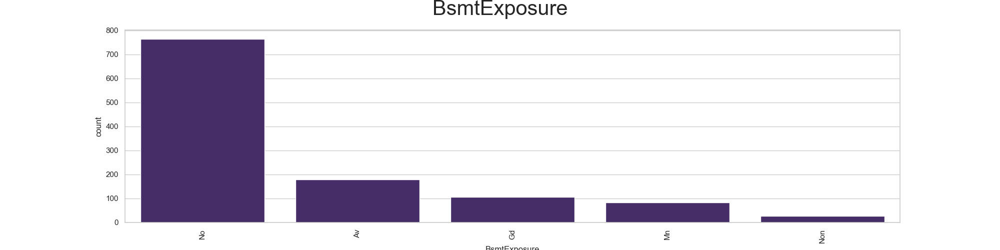

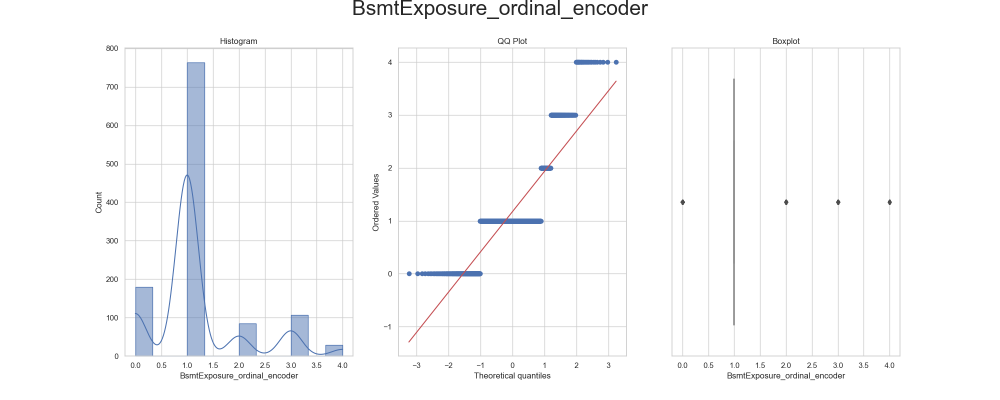



* Variable Analyzed: BsmtFinType1
* Applied transformation: ['BsmtFinType1_ordinal_encoder'] 



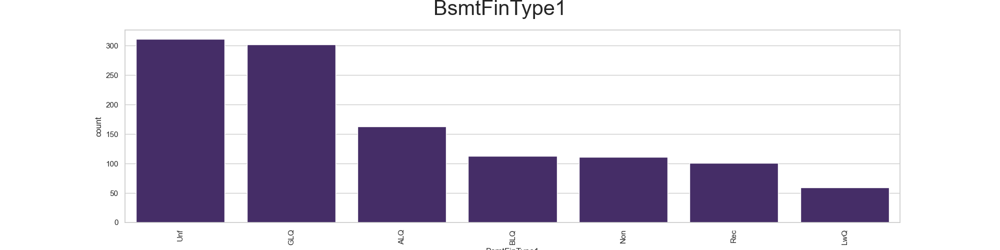

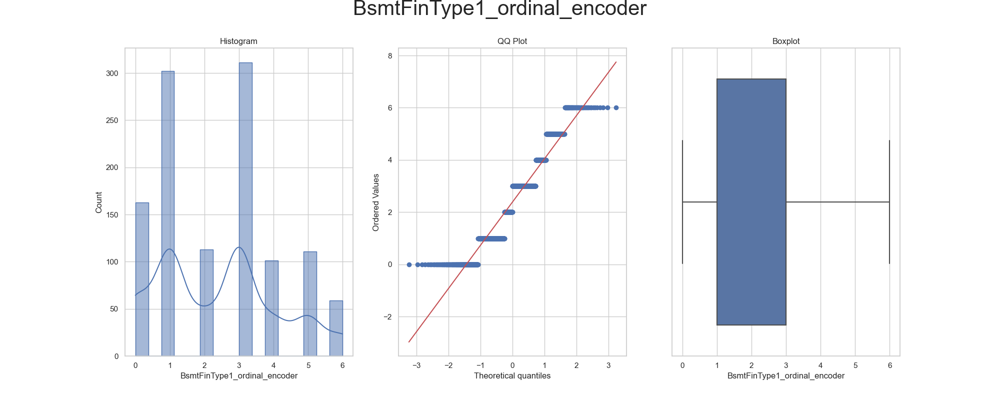



* Variable Analyzed: GarageFinish
* Applied transformation: ['GarageFinish_ordinal_encoder'] 



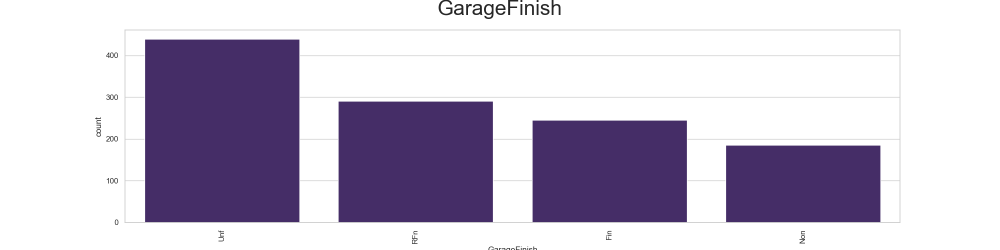

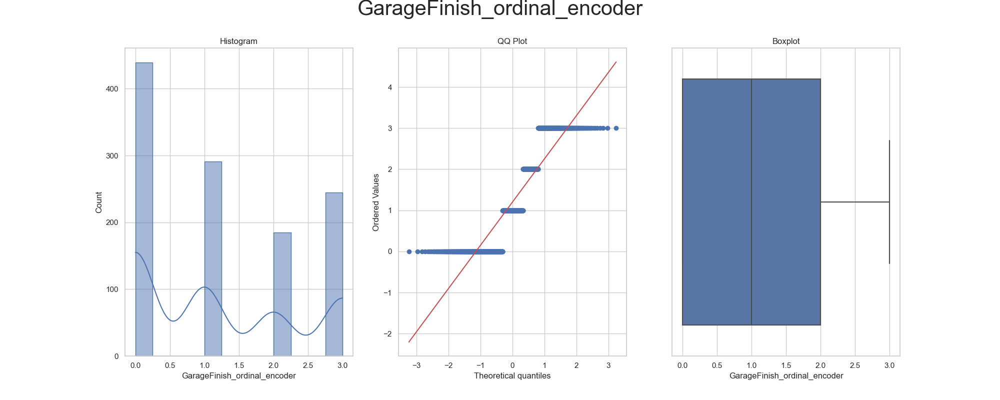



* Variable Analyzed: KitchenQual
* Applied transformation: ['KitchenQual_ordinal_encoder'] 



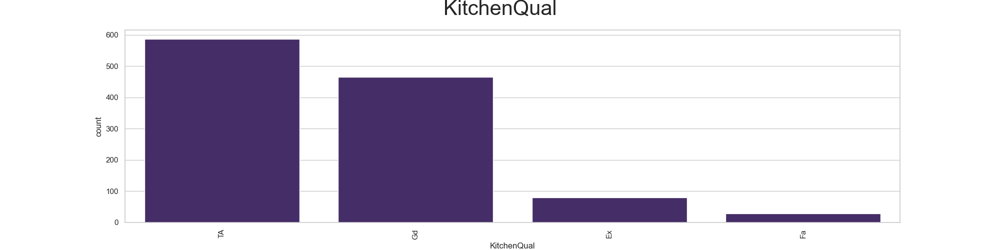

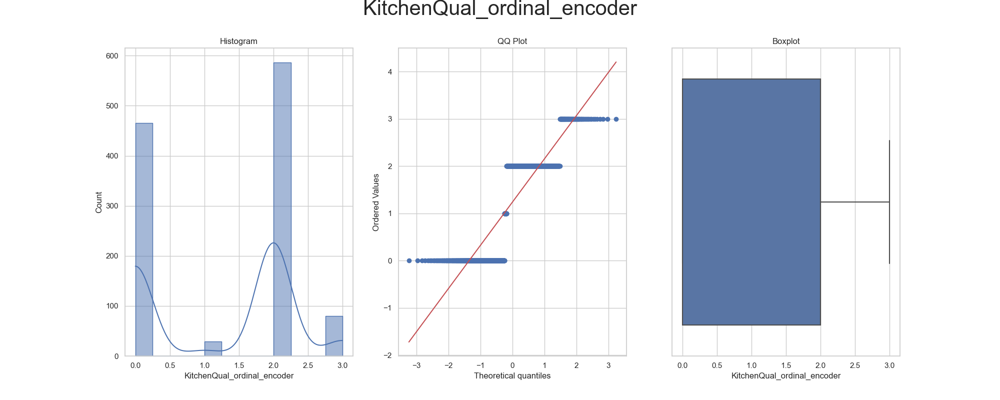

In [10]:
    df_categorical_variables = FeatureEngineeringAnalysis(df=df_categorical_variables, analysis_type='ordinal_encoder')

### Numerical Transformation
* Step 1: Select variables(s)

In [11]:
numerical_variables = TrainSet.columns[TrainSet.dtypes!='object'].to_list()
numerical_variables

['1stFlrSF',
 '2ndFlrSF',
 'BedroomAbvGr',
 'BsmtFinSF1',
 'BsmtUnfSF',
 'GarageArea',
 'GarageYrBlt',
 'GrLivArea',
 'LotArea',
 'LotFrontage',
 'MasVnrArea',
 'OpenPorchSF',
 'OverallCond',
 'OverallQual',
 'TotalBsmtSF',
 'YearBuilt',
 'YearRemodAdd',
 'SalePrice']

* Step 2: Create a separate DataFrame, with your variable(s)

In [12]:
df_numerical_variables = TrainSet[numerical_variables].copy()
df_numerical_variables.head()

,1stFlrSF,2ndFlrSF,BedroomAbvGr,BsmtFinSF1,BsmtUnfSF,GarageArea,GarageYrBlt,GrLivArea,LotArea,LotFrontage,MasVnrArea,OpenPorchSF,OverallCond,OverallQual,TotalBsmtSF,YearBuilt,YearRemodAdd,SalePrice
0,2158,0.0,4.000000,477,725,576,1950.0,2158,12615,84.000000,0.0,29,7,6,1202,1950,2001,243000
1,1614,0.0,3.000000,20,1594,865,2005.0,1614,11210,86.000000,240.0,59,5,7,1614,2005,2006,221500
2,810,672.0,2.873045,156,516,400,1934.0,1482,12155,70.243187,0.0,0,8,6,672,1925,1950,140000
3,894,0.0,3.000000,492,402,450,1968.0,894,8724,109.000000,0.0,0,5,5,894,1968,1968,129000
4,864,0.0,3.000000,0,864,280,1972.0,864,9353,71.000000,0.0,0,5,4,864,1970,1970,116050


* Step 3: Create engineered variables(s) by applying the transformation(s), assess engineered variables distribution and select the most suitable method

* Variable Analyzed: 1stFlrSF
* Applied transformation: ['1stFlrSF_log_e', '1stFlrSF_log_10', '1stFlrSF_reciprocal', '1stFlrSF_power', '1stFlrSF_box_cox', '1stFlrSF_yeo_johnson'] 



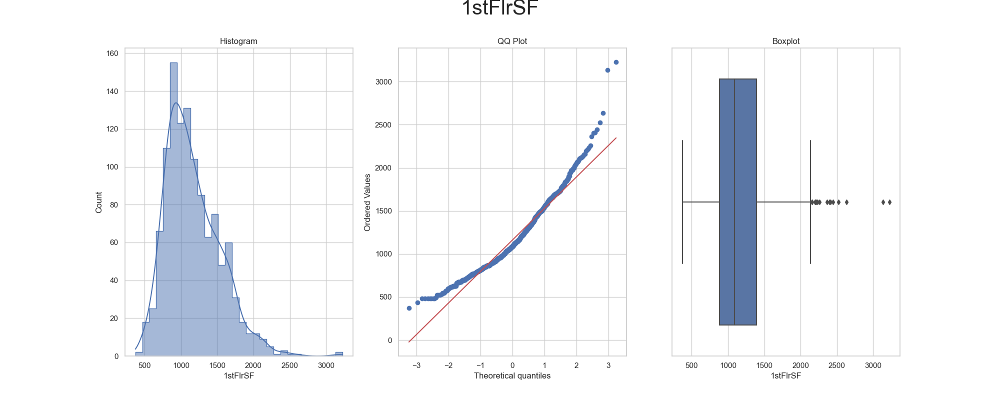

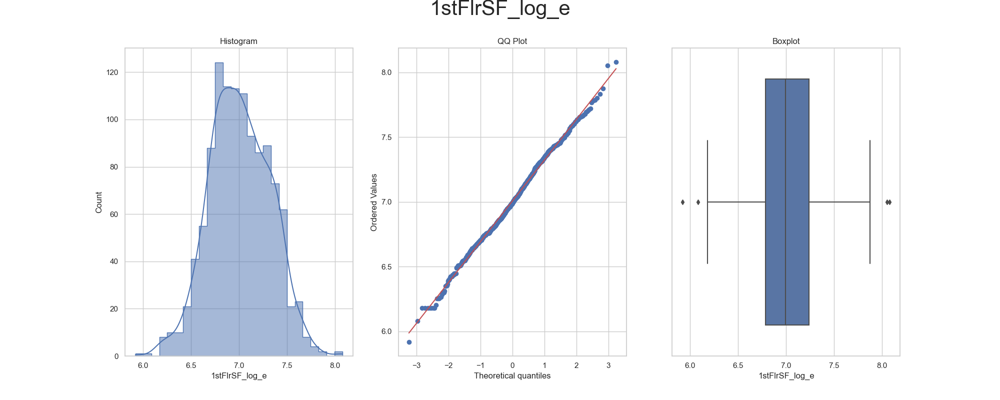

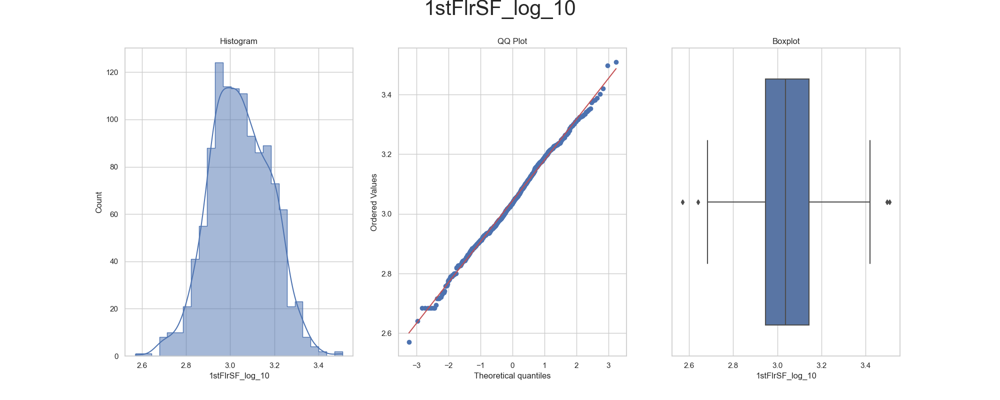

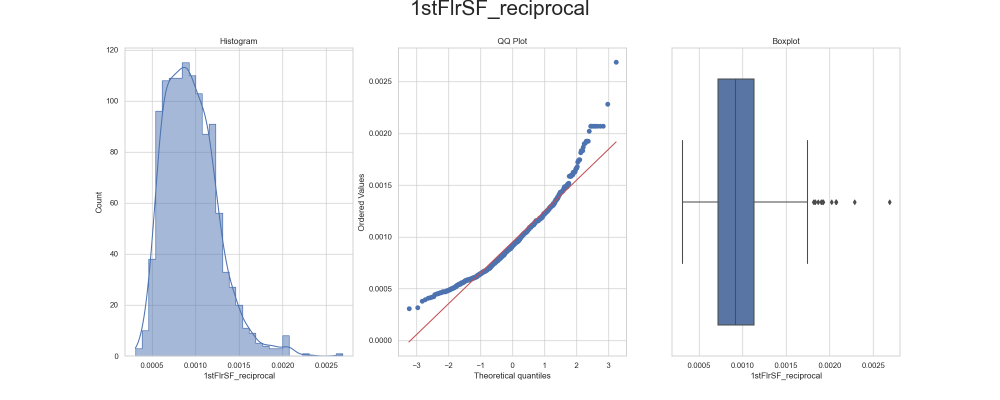

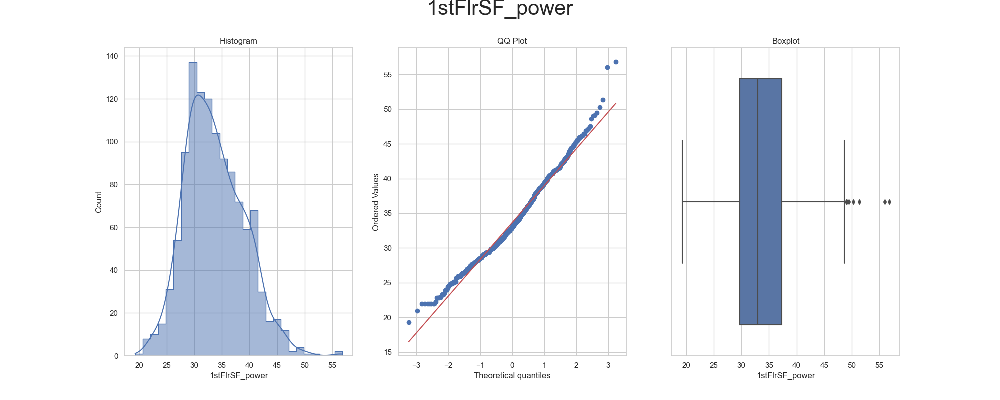

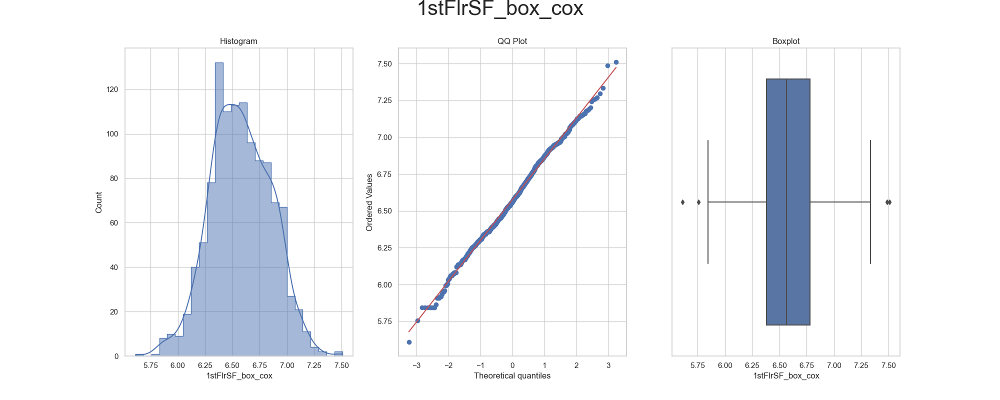

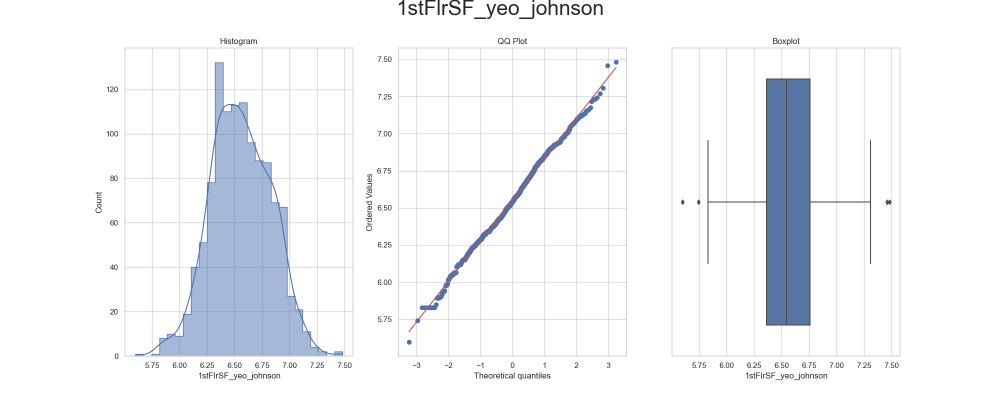



* Variable Analyzed: 2ndFlrSF
* Applied transformation: ['2ndFlrSF_power', '2ndFlrSF_yeo_johnson'] 



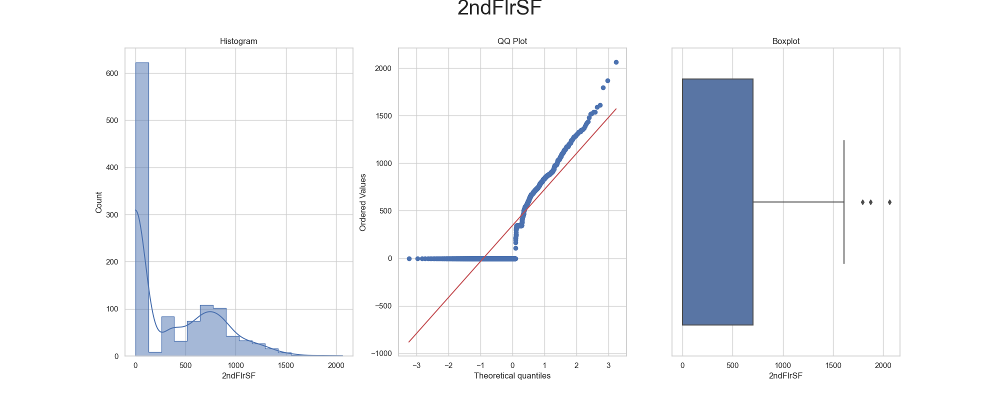

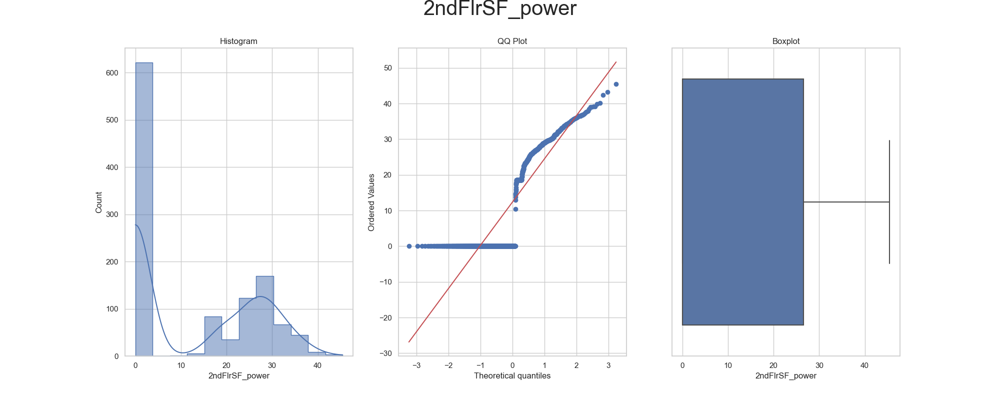

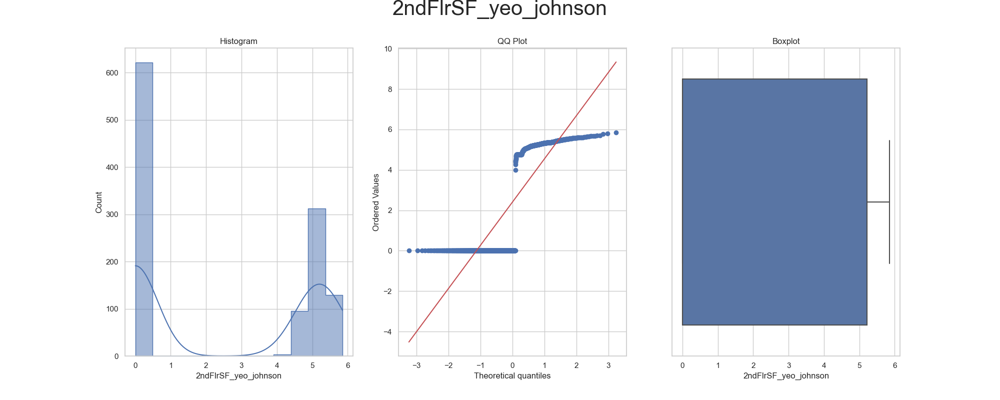



* Variable Analyzed: BedroomAbvGr
* Applied transformation: ['BedroomAbvGr_power', 'BedroomAbvGr_yeo_johnson'] 



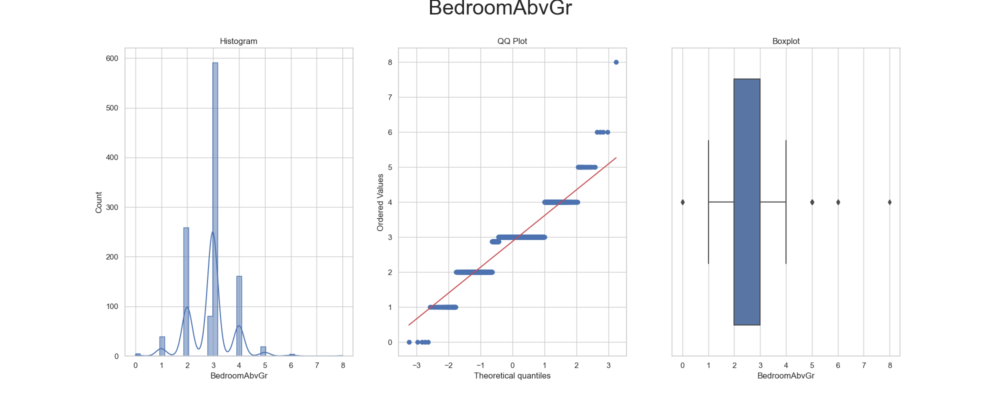

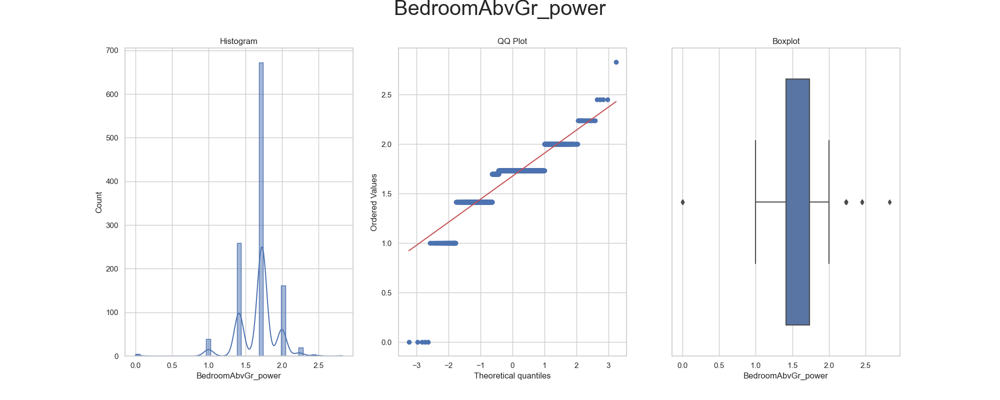

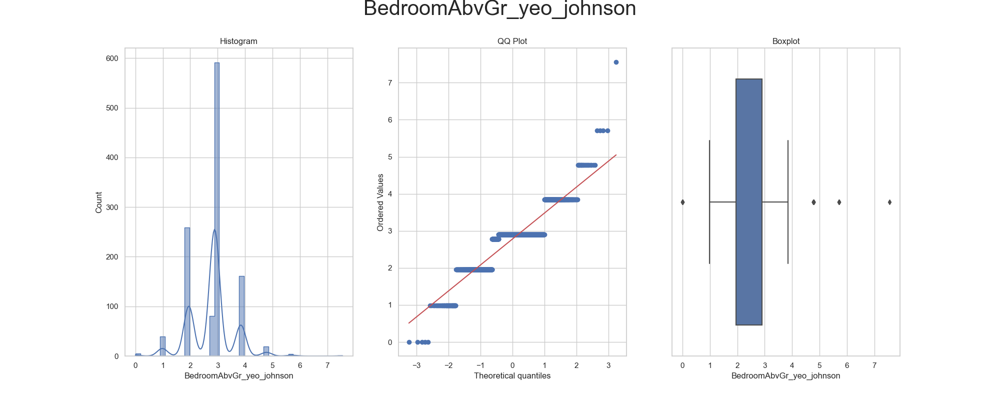



* Variable Analyzed: BsmtFinSF1
* Applied transformation: ['BsmtFinSF1_power', 'BsmtFinSF1_yeo_johnson'] 



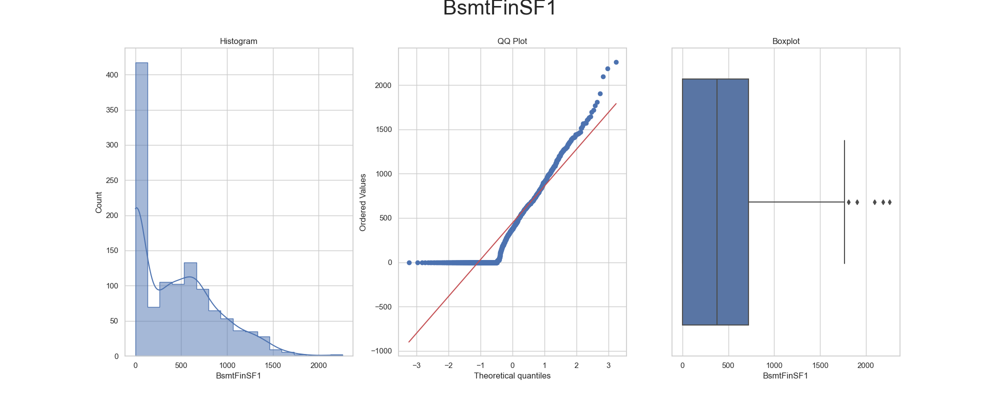

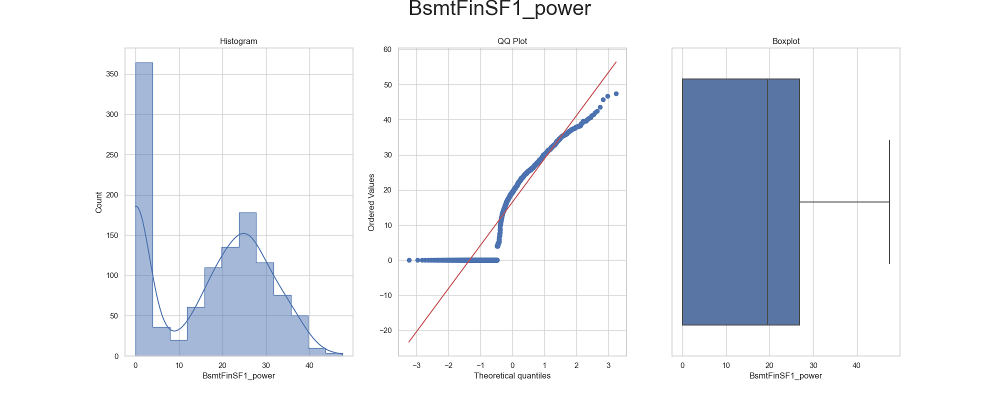

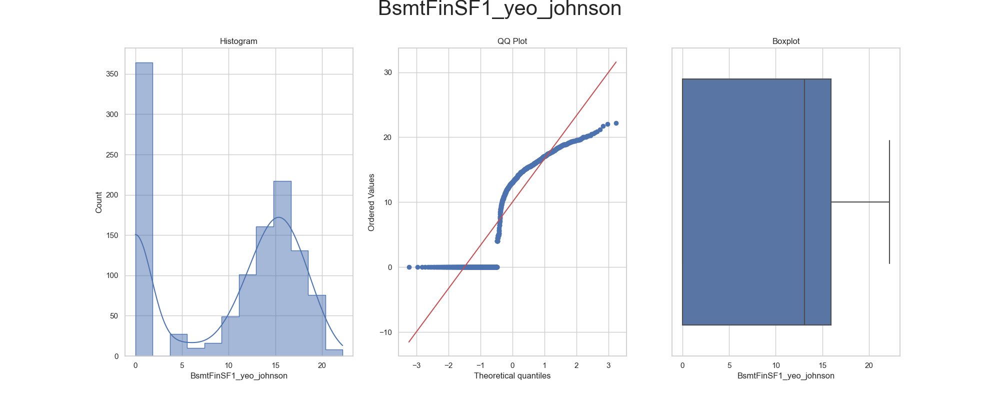



* Variable Analyzed: BsmtUnfSF
* Applied transformation: ['BsmtUnfSF_power', 'BsmtUnfSF_yeo_johnson'] 



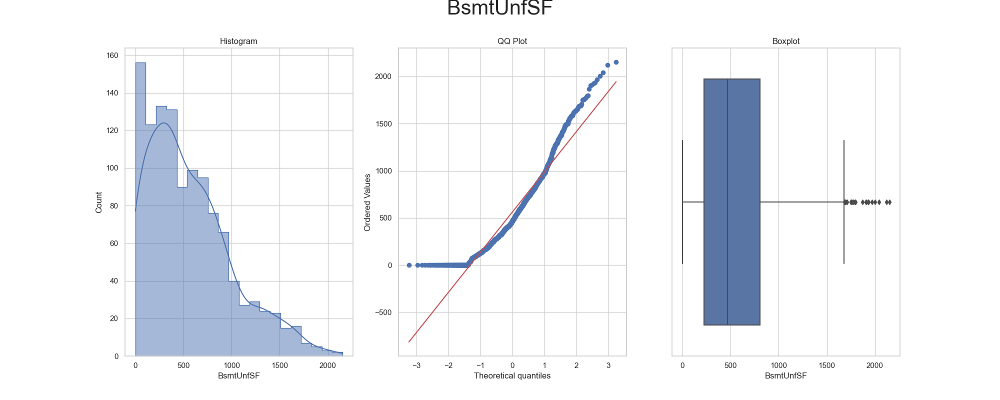

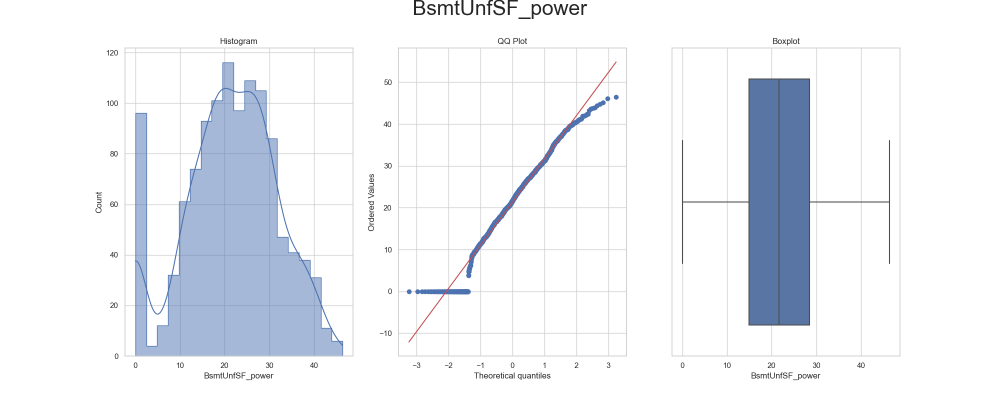

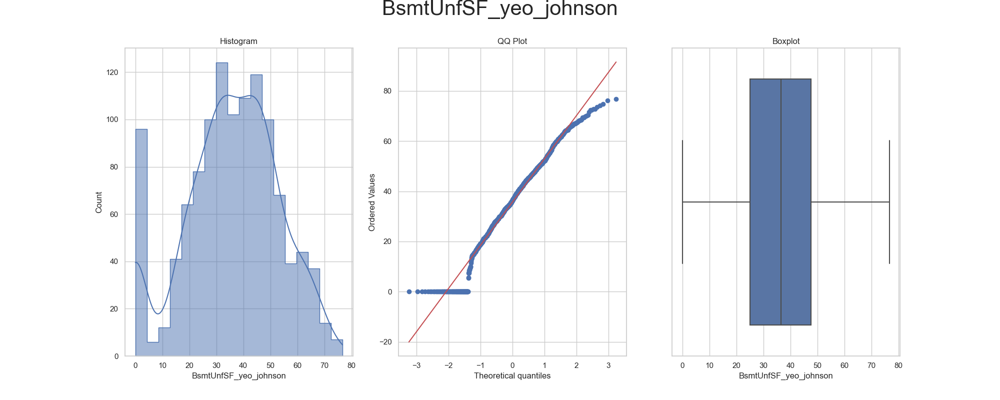



* Variable Analyzed: GarageArea
* Applied transformation: ['GarageArea_power', 'GarageArea_yeo_johnson'] 



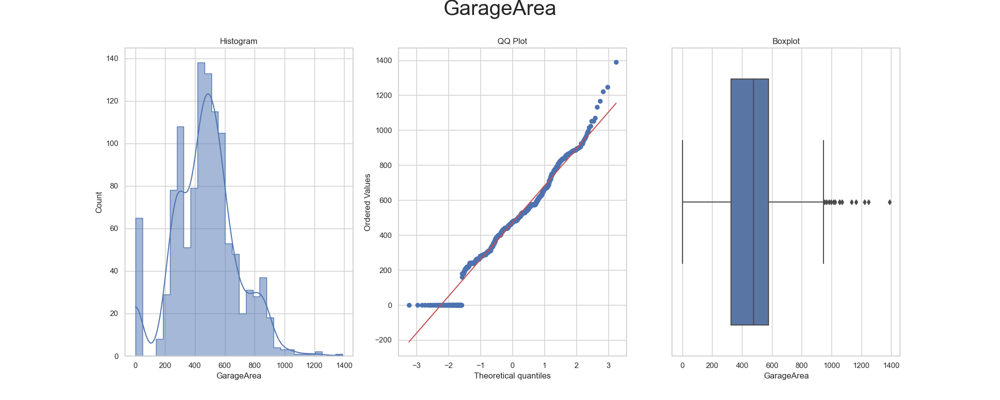

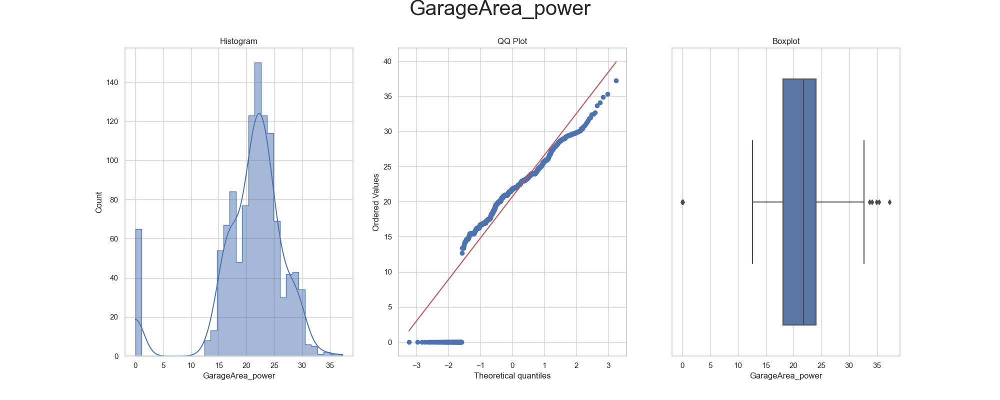

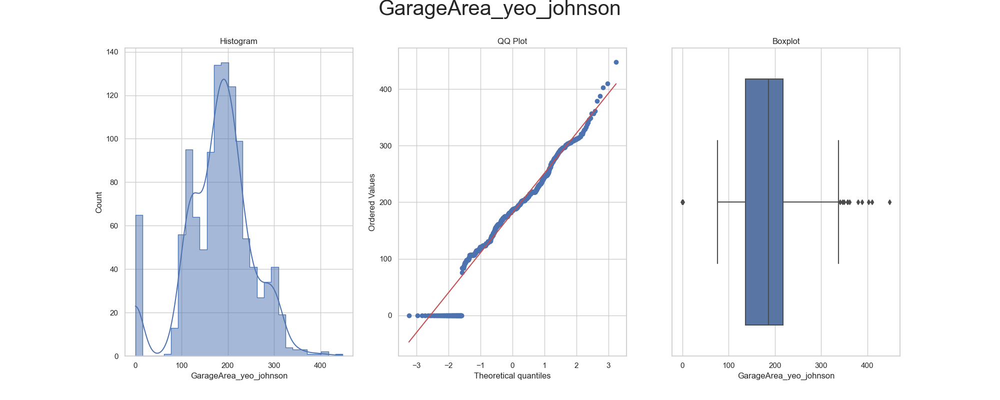



* Variable Analyzed: GarageYrBlt
* Applied transformation: ['GarageYrBlt_log_e', 'GarageYrBlt_log_10', 'GarageYrBlt_reciprocal', 'GarageYrBlt_power', 'GarageYrBlt_box_cox', 'GarageYrBlt_yeo_johnson'] 



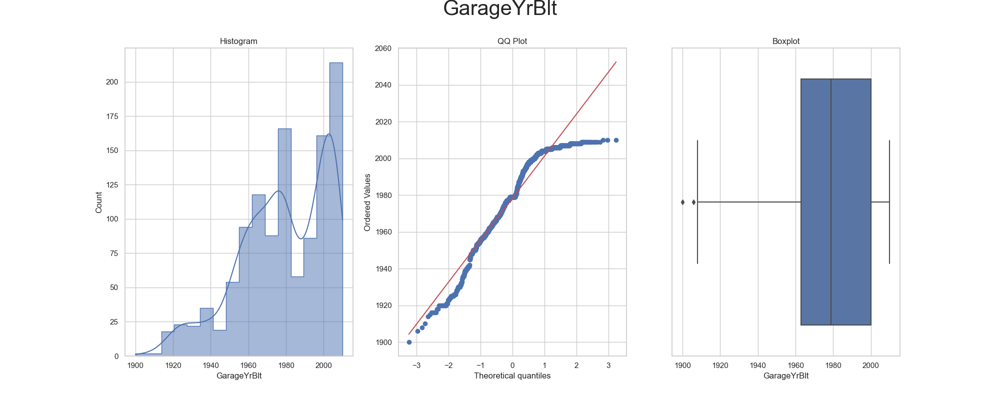

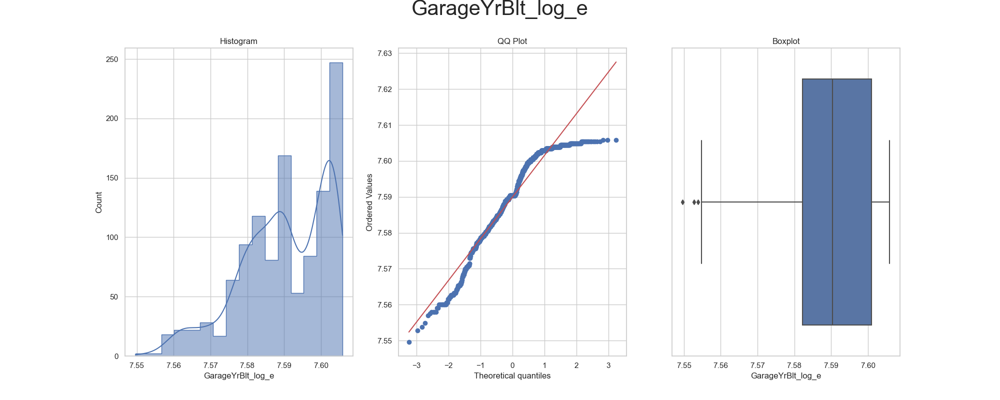

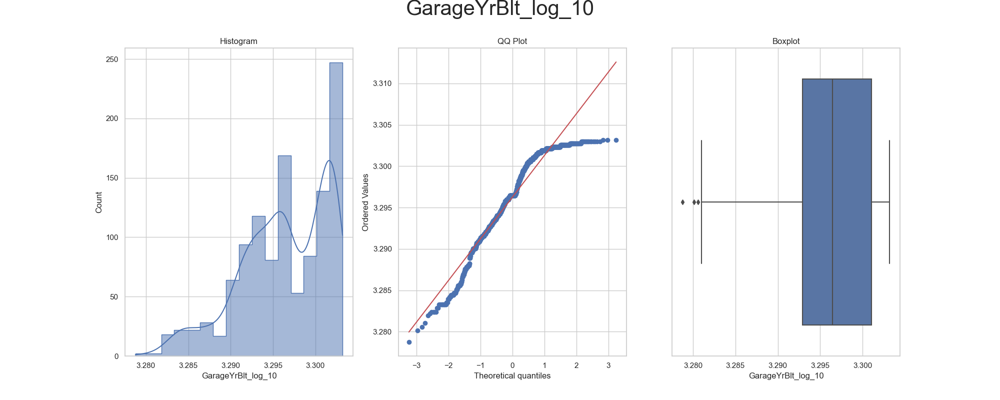

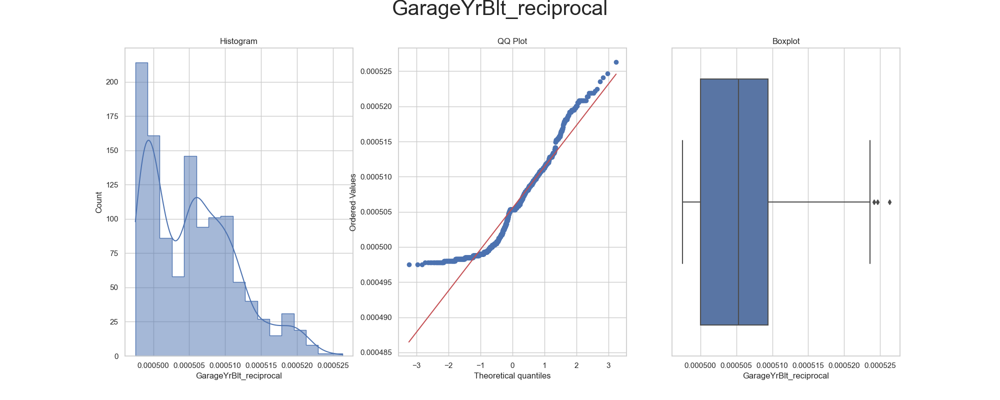

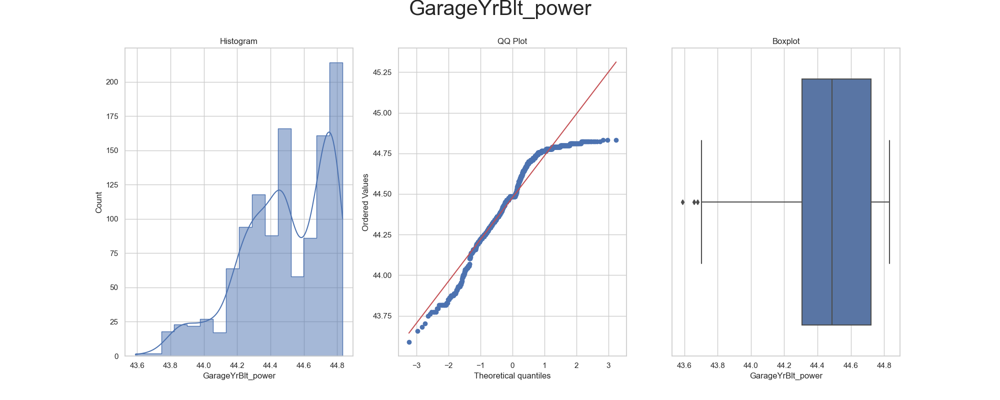

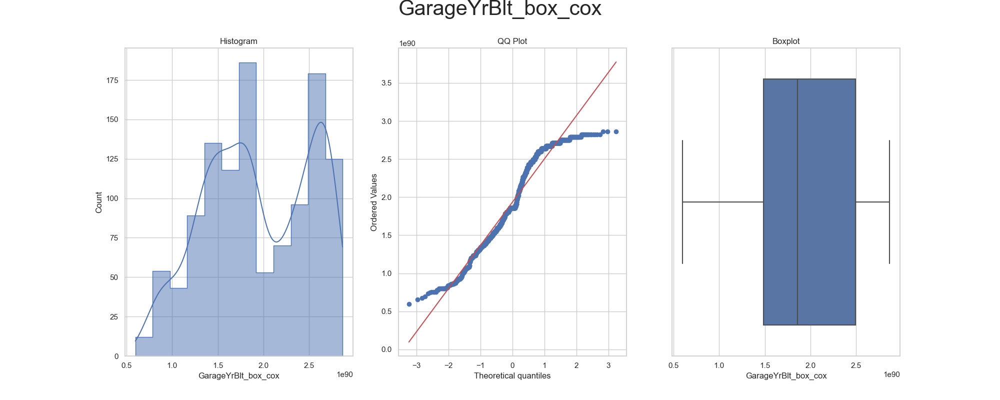

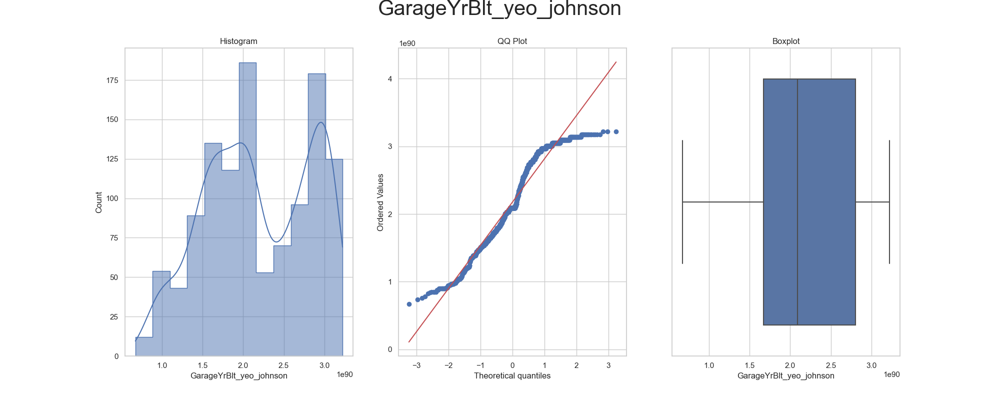



* Variable Analyzed: GrLivArea
* Applied transformation: ['GrLivArea_log_e', 'GrLivArea_log_10', 'GrLivArea_reciprocal', 'GrLivArea_power', 'GrLivArea_box_cox', 'GrLivArea_yeo_johnson'] 



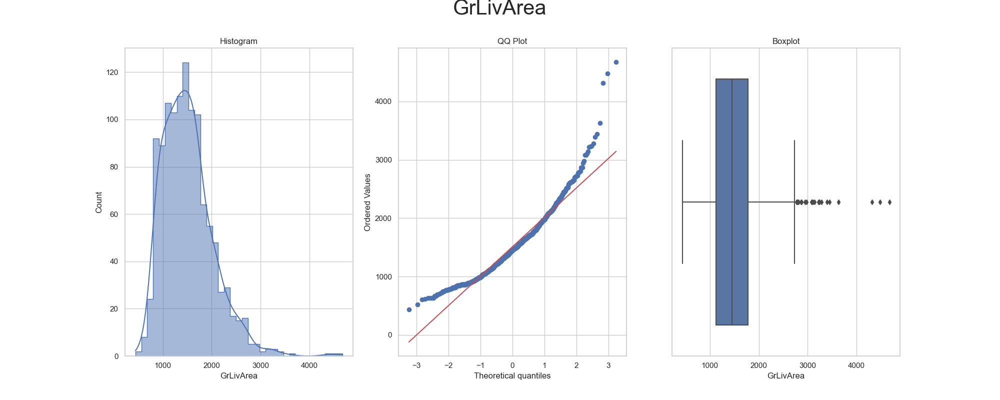

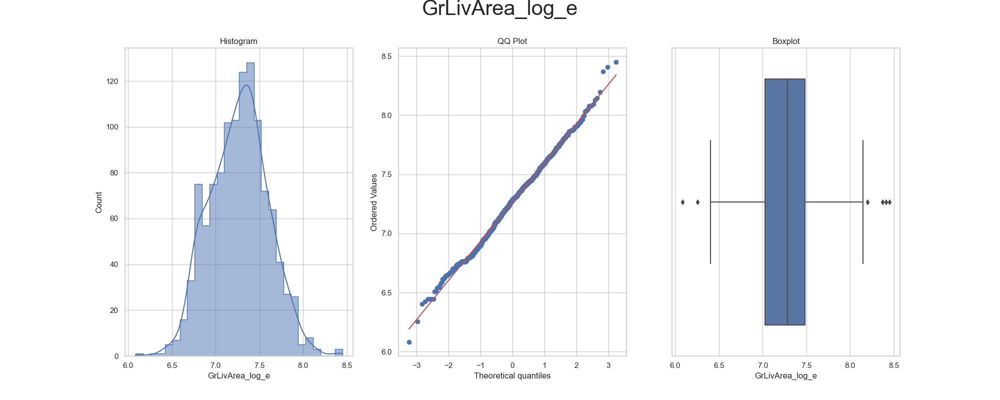

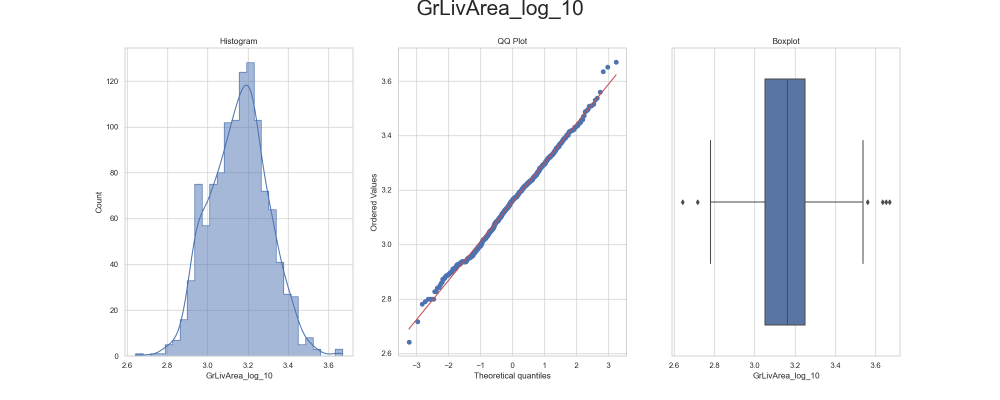

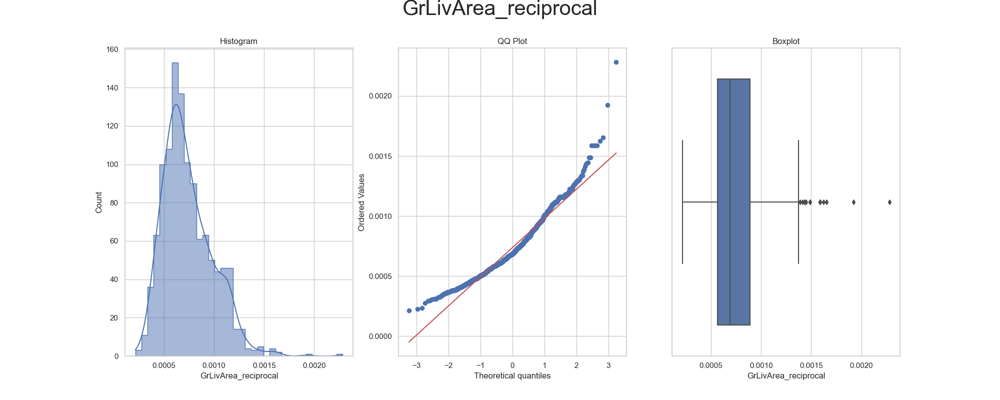

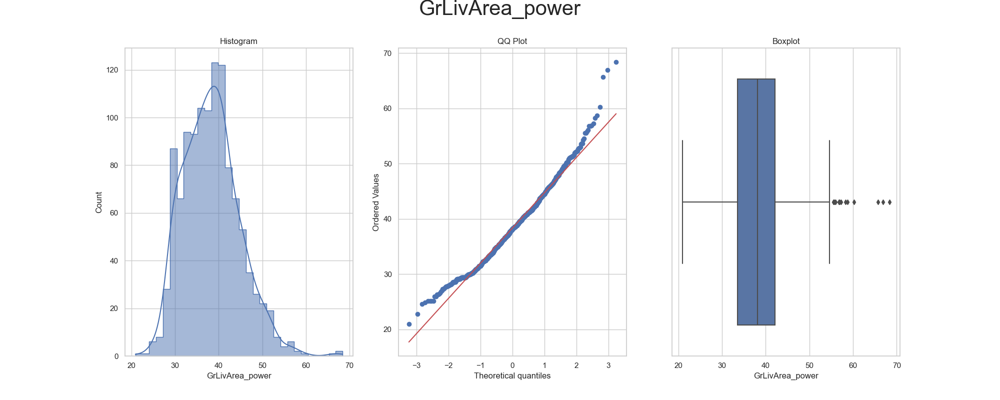

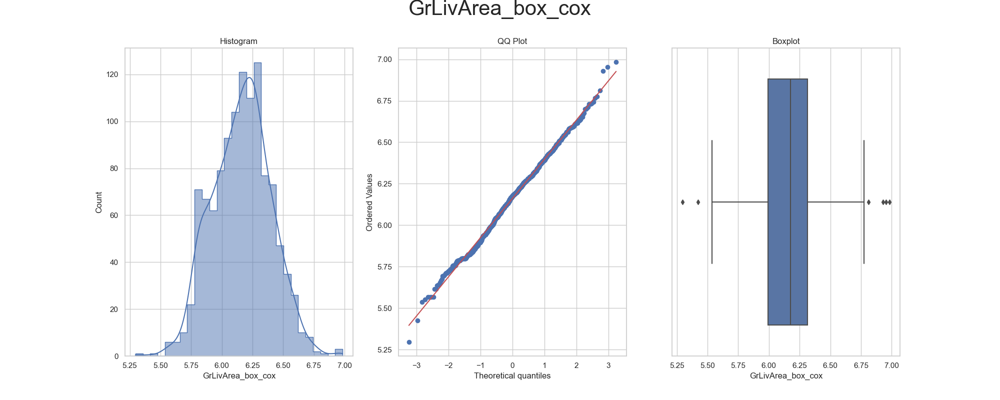

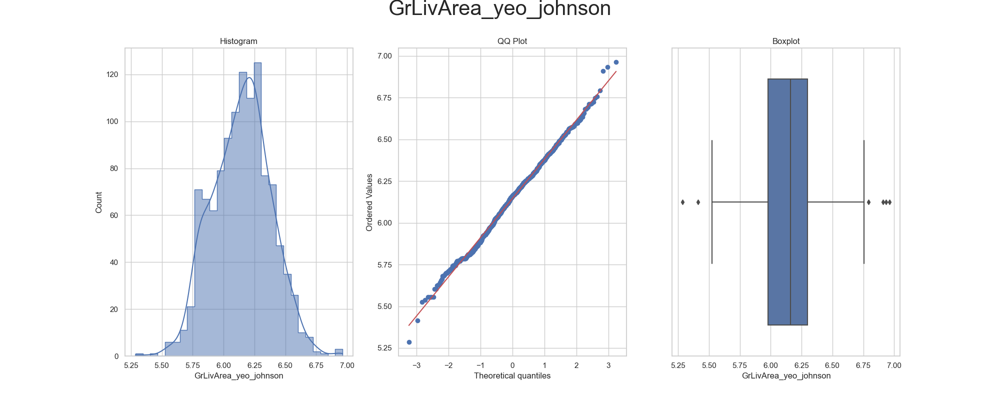



* Variable Analyzed: LotArea
* Applied transformation: ['LotArea_log_e', 'LotArea_log_10', 'LotArea_reciprocal', 'LotArea_power', 'LotArea_box_cox', 'LotArea_yeo_johnson'] 



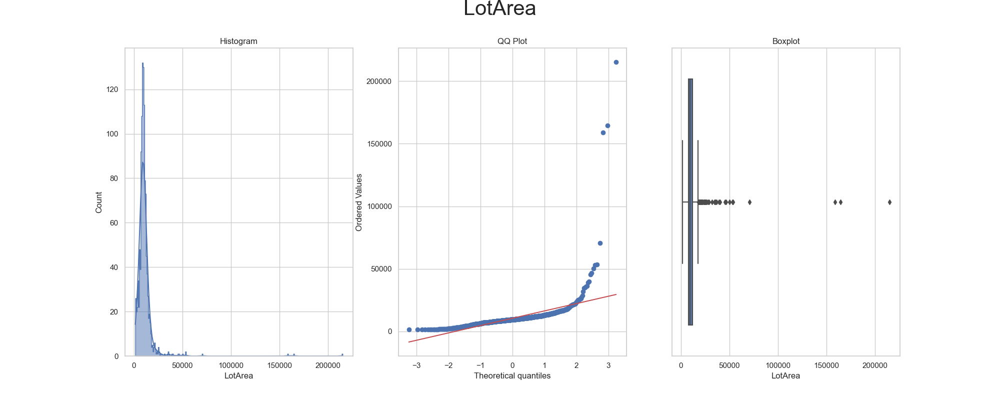

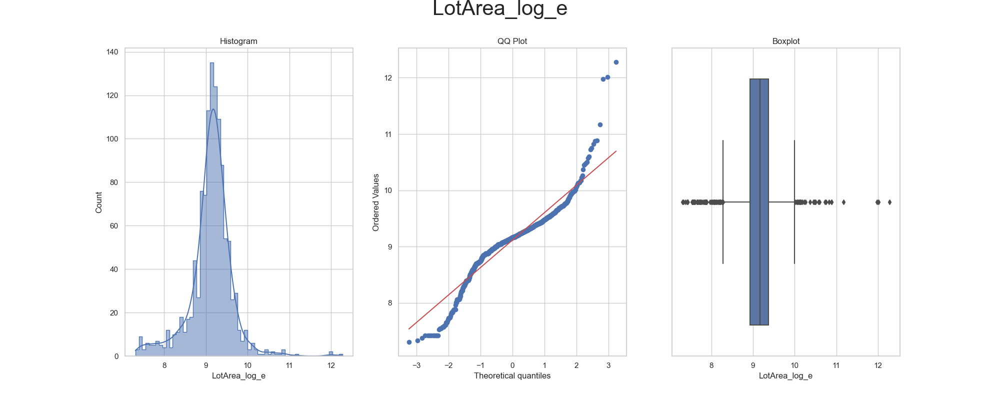

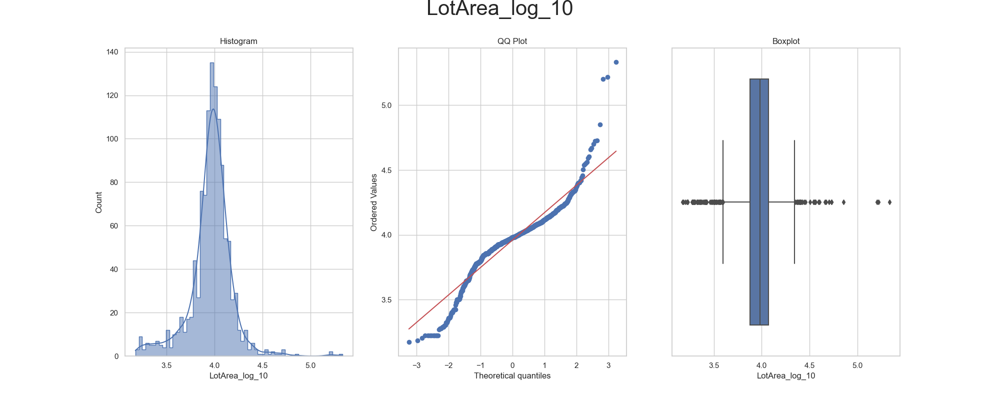

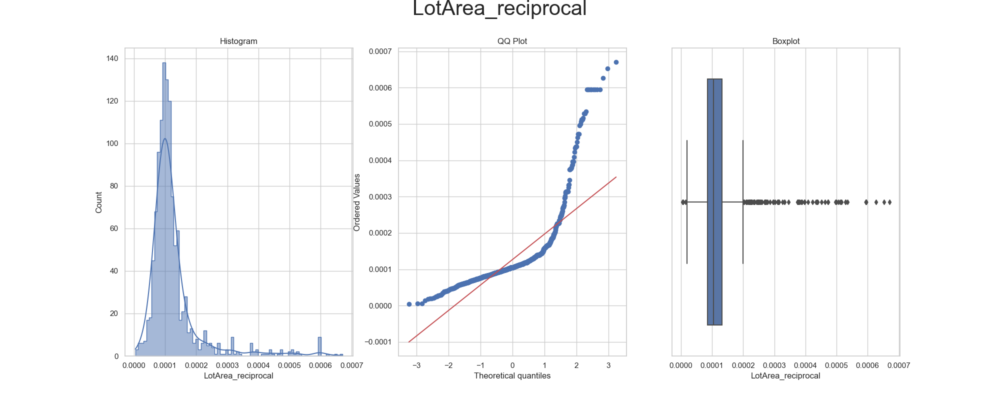

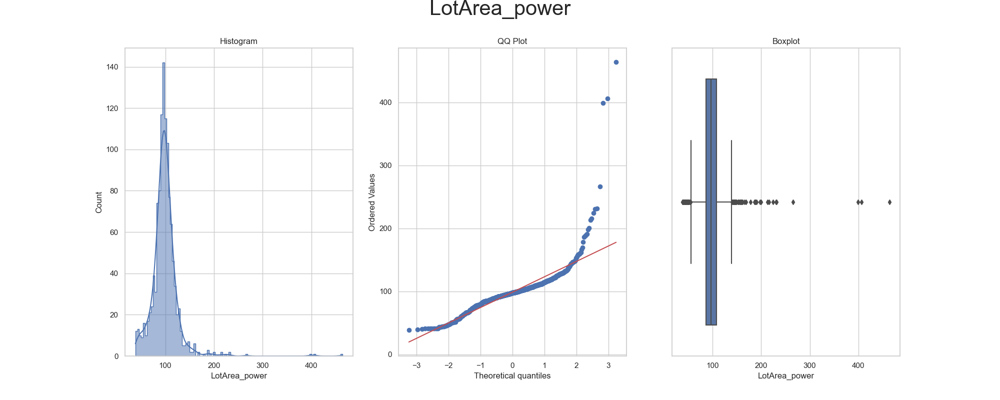

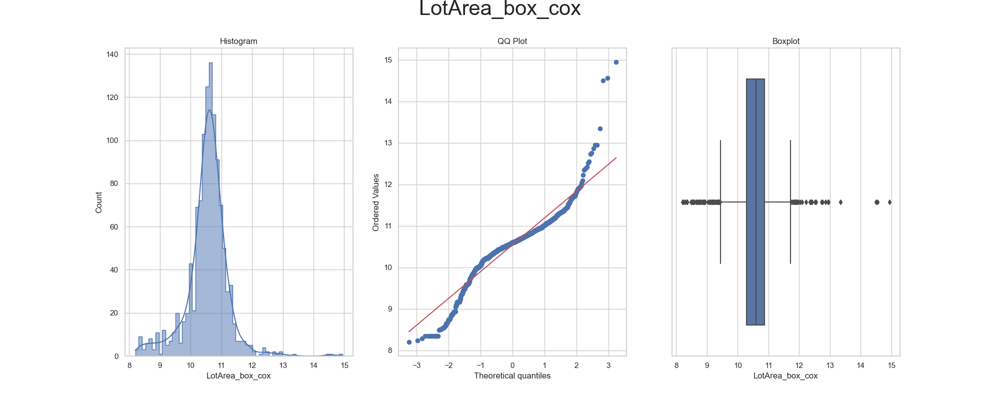

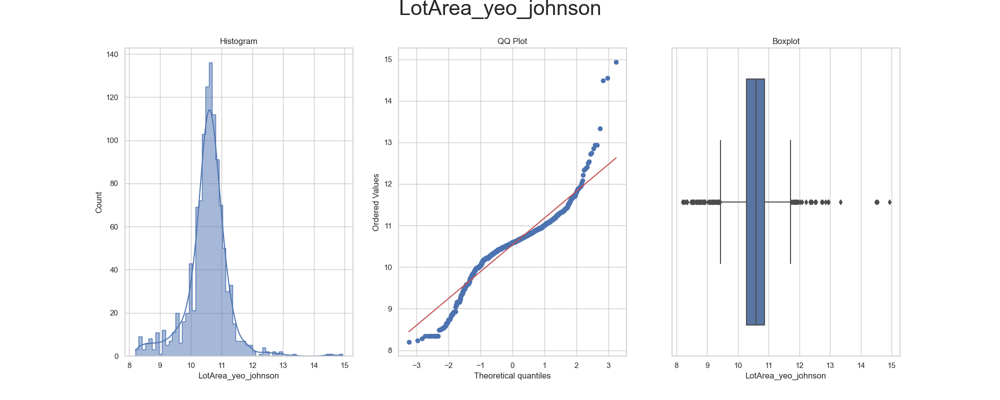



* Variable Analyzed: LotFrontage
* Applied transformation: ['LotFrontage_log_e', 'LotFrontage_log_10', 'LotFrontage_reciprocal', 'LotFrontage_power', 'LotFrontage_box_cox', 'LotFrontage_yeo_johnson'] 



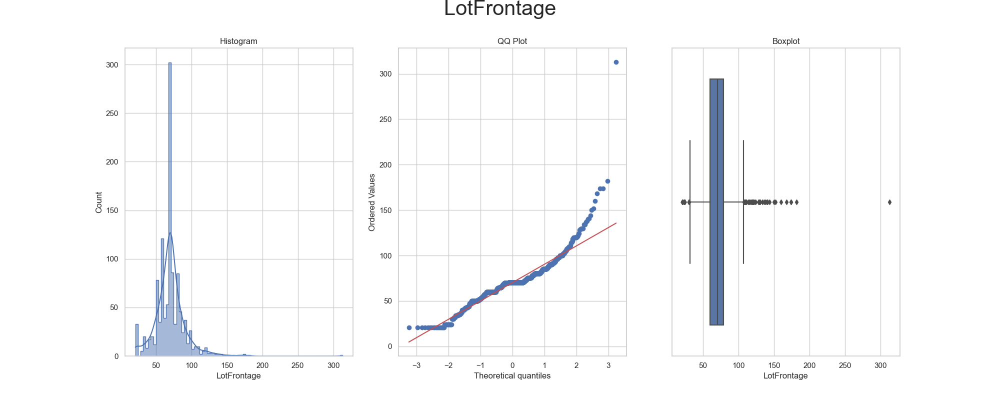

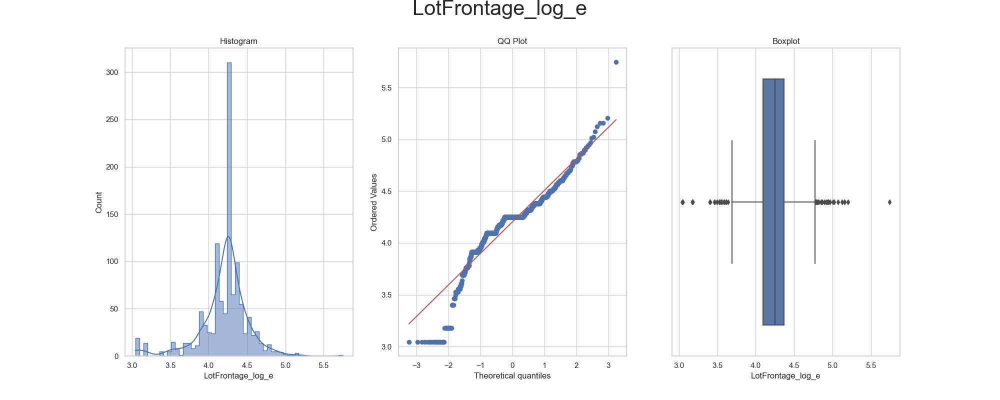

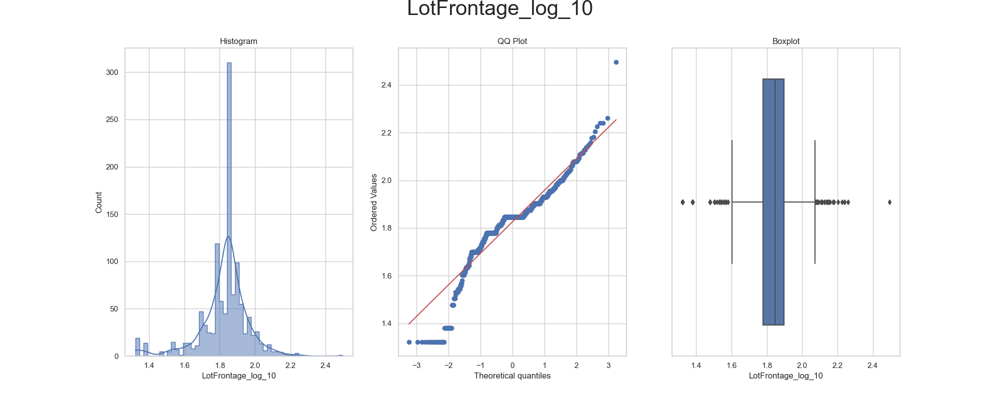

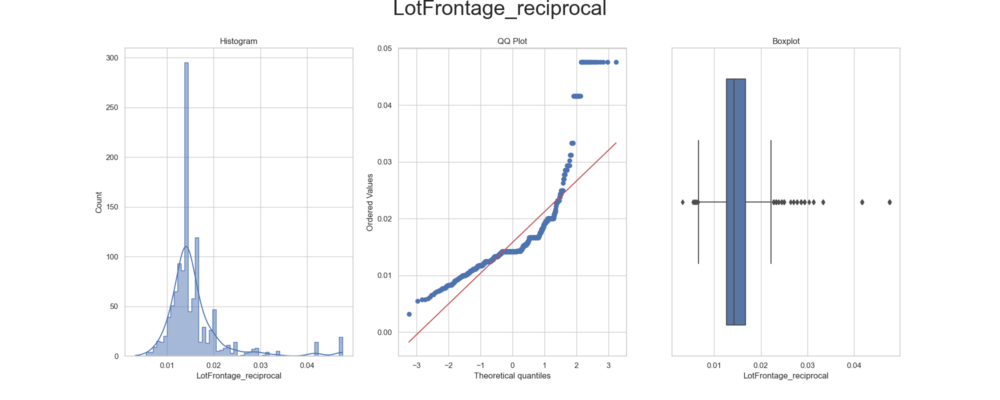

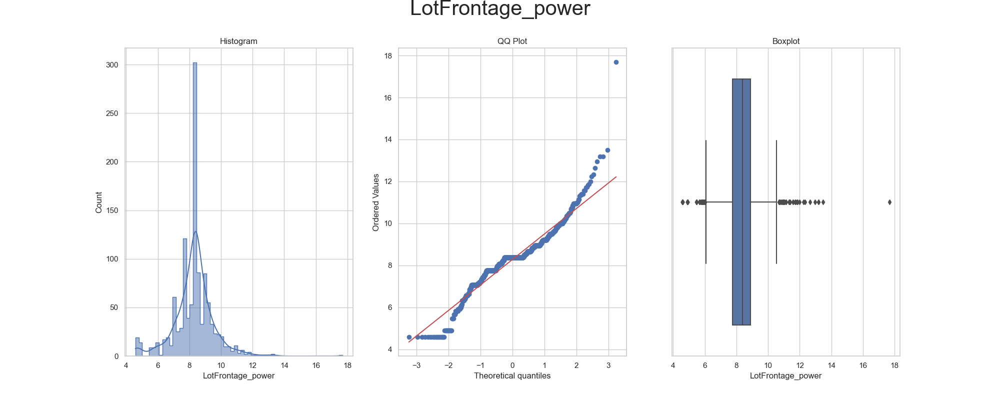

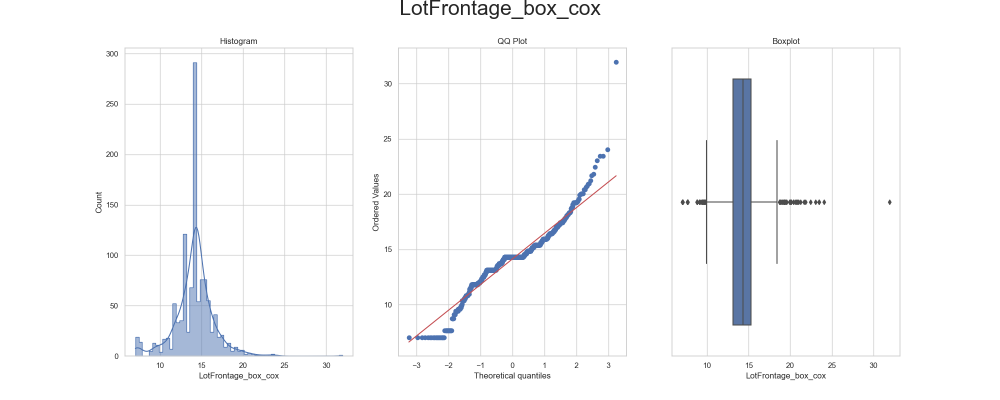

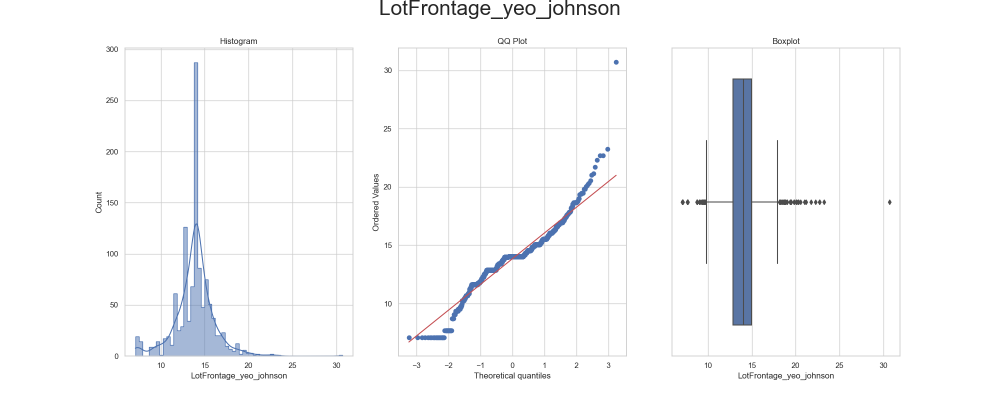



* Variable Analyzed: MasVnrArea
* Applied transformation: ['MasVnrArea_power', 'MasVnrArea_yeo_johnson'] 



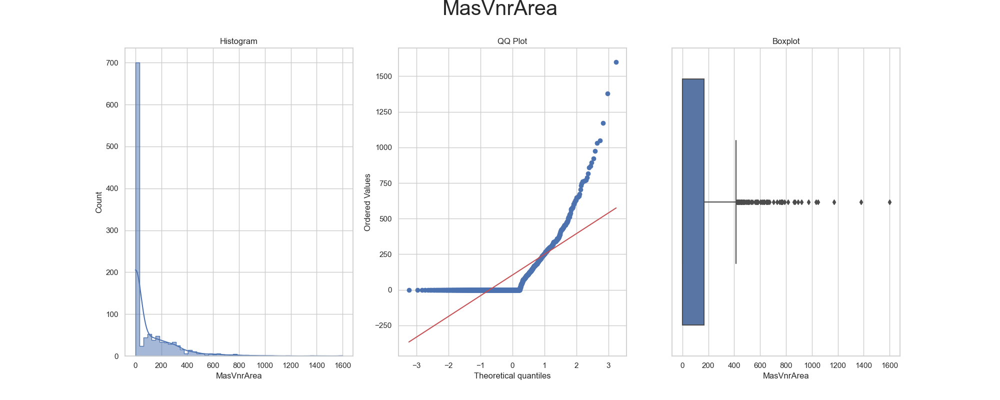

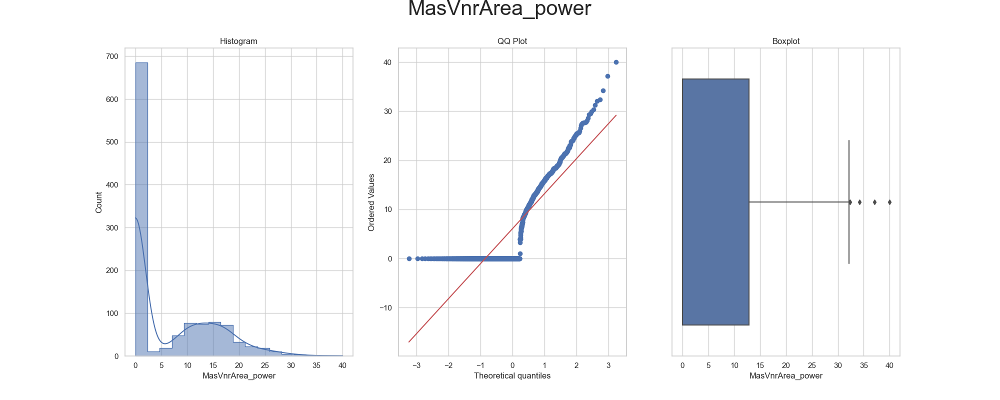

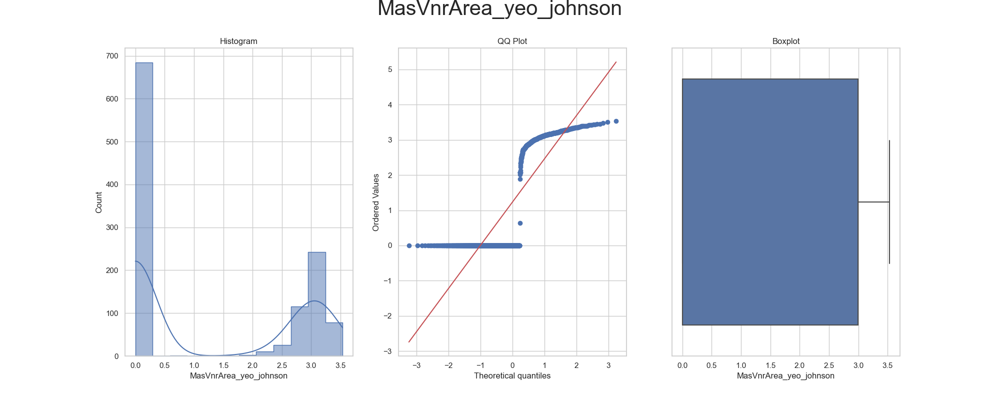



* Variable Analyzed: OpenPorchSF
* Applied transformation: ['OpenPorchSF_power', 'OpenPorchSF_yeo_johnson'] 



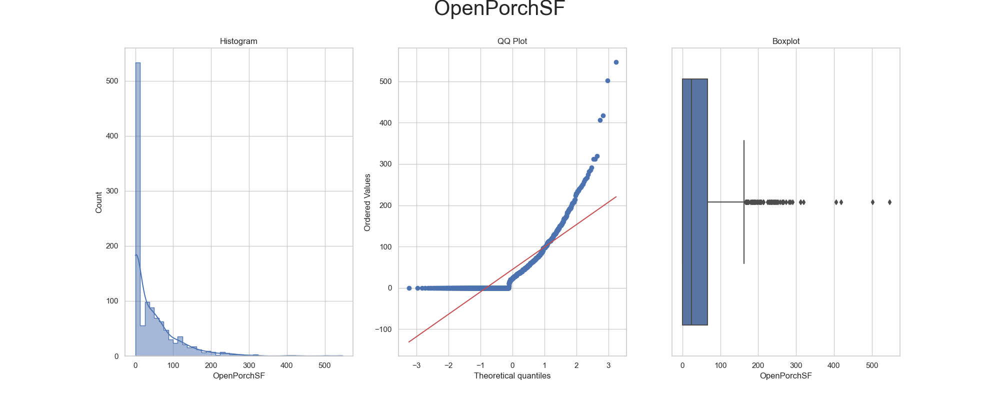

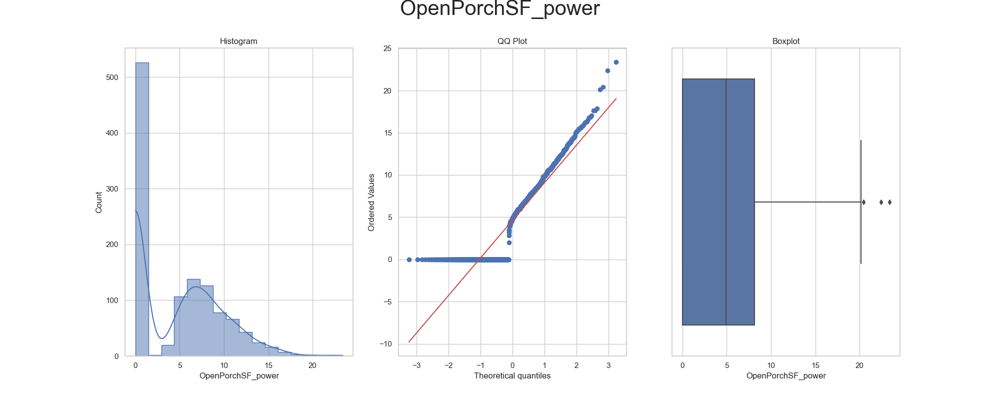

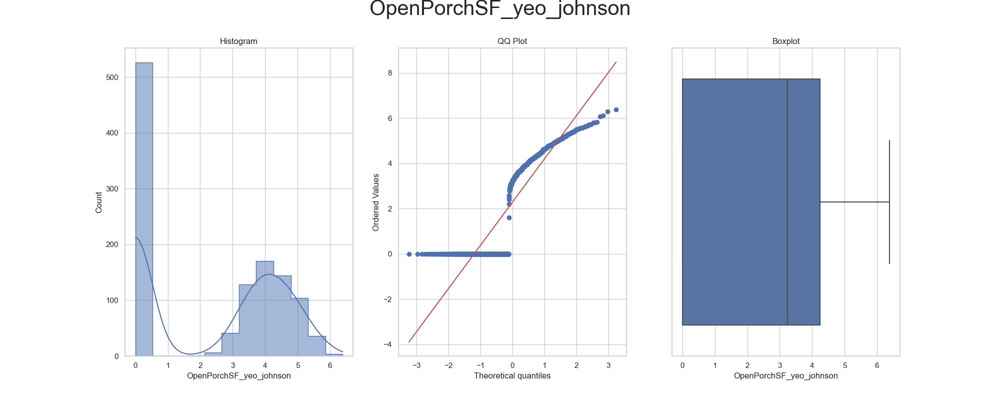



* Variable Analyzed: OverallCond
* Applied transformation: ['OverallCond_log_e', 'OverallCond_log_10', 'OverallCond_reciprocal', 'OverallCond_power', 'OverallCond_box_cox', 'OverallCond_yeo_johnson'] 



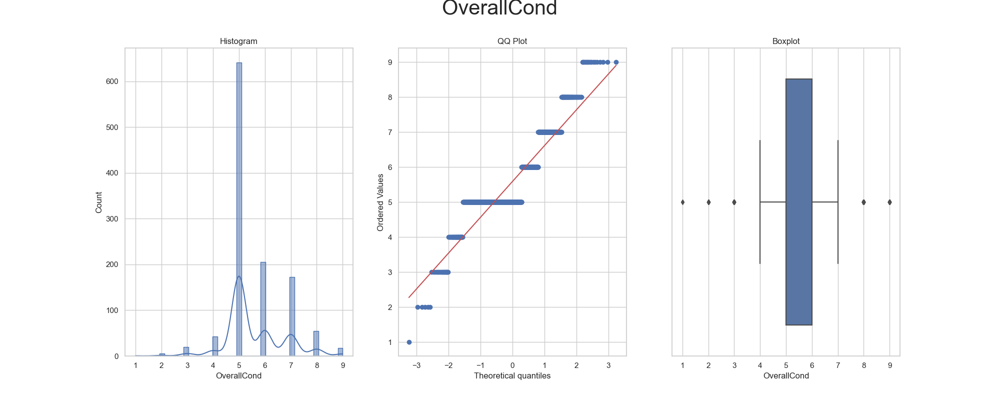

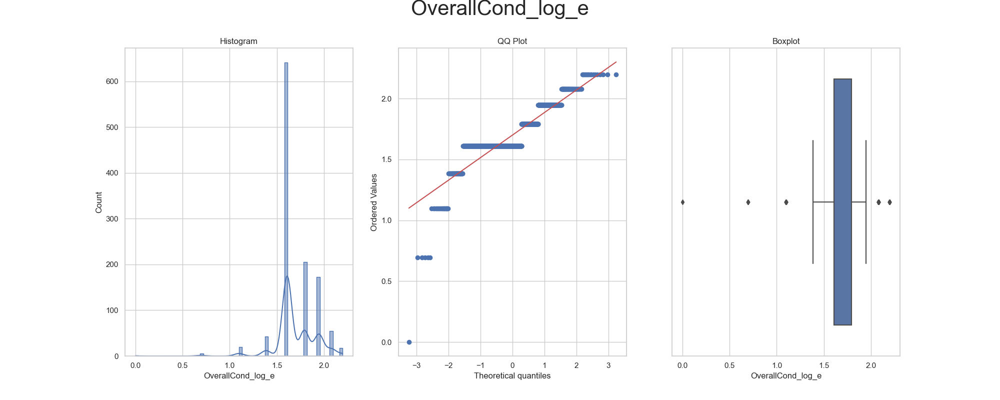

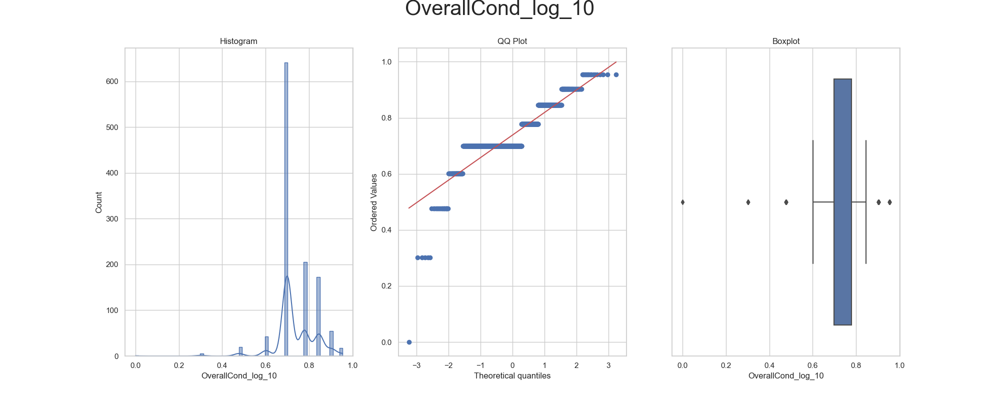

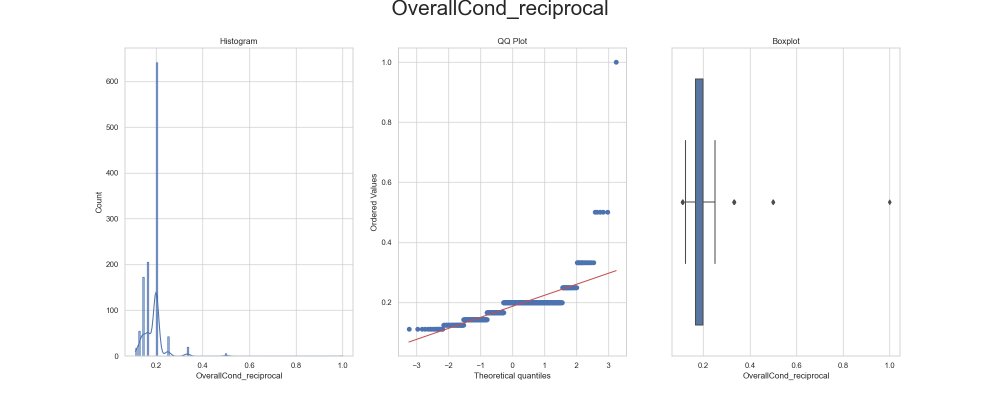

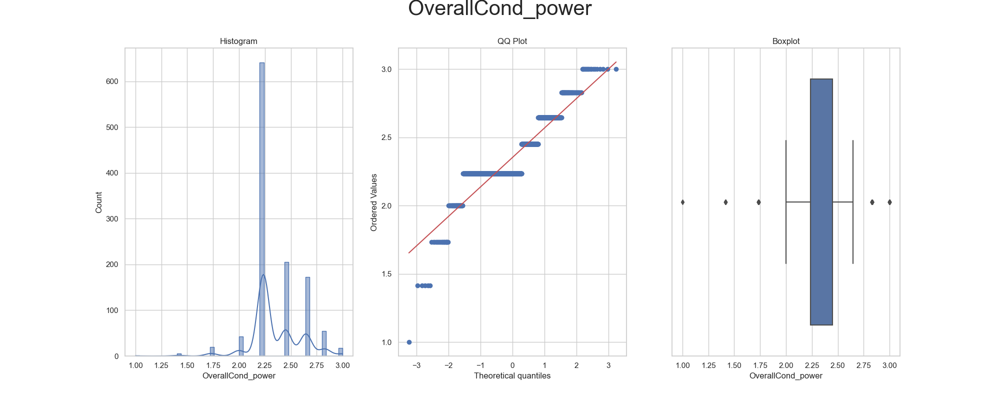

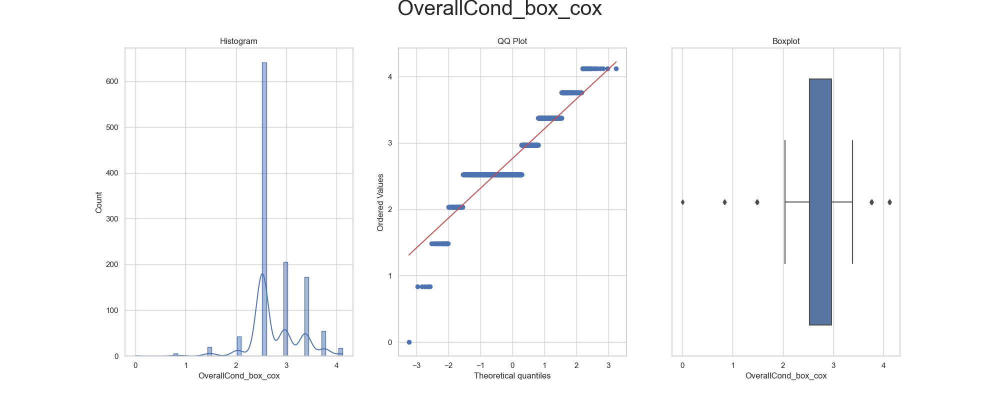

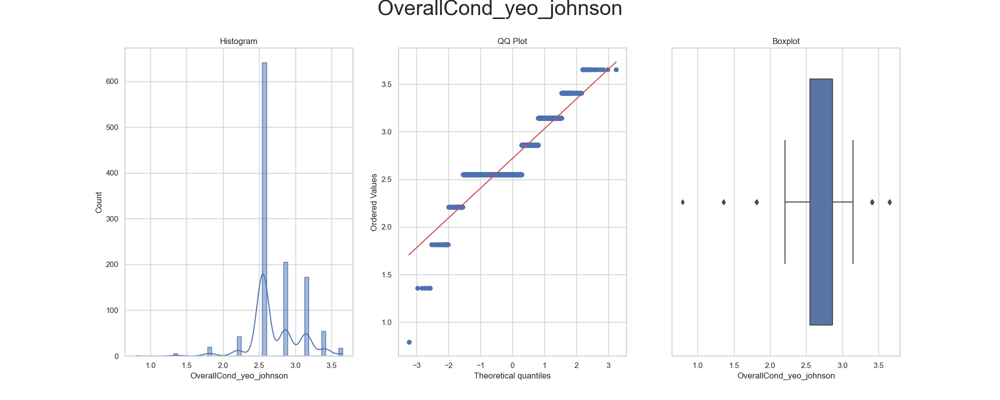



* Variable Analyzed: OverallQual
* Applied transformation: ['OverallQual_log_e', 'OverallQual_log_10', 'OverallQual_reciprocal', 'OverallQual_power', 'OverallQual_box_cox', 'OverallQual_yeo_johnson'] 



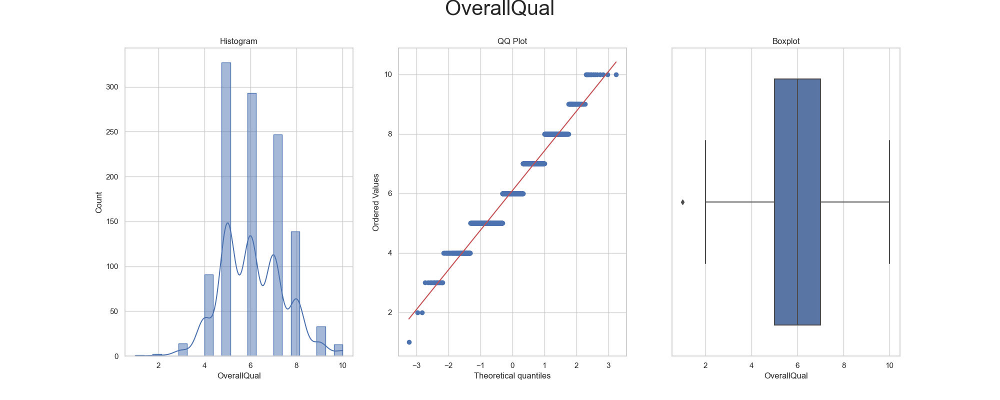

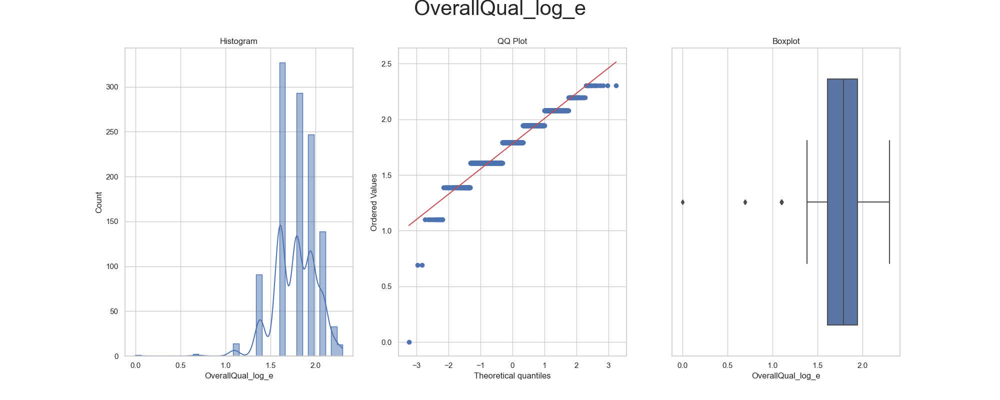

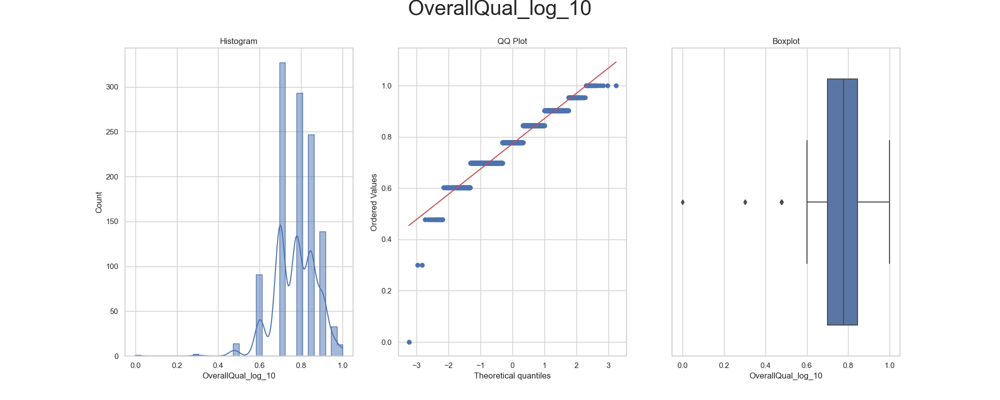

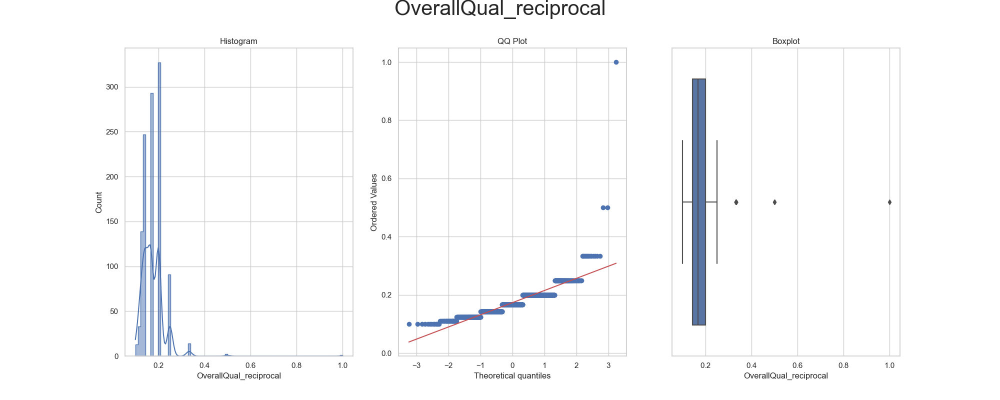

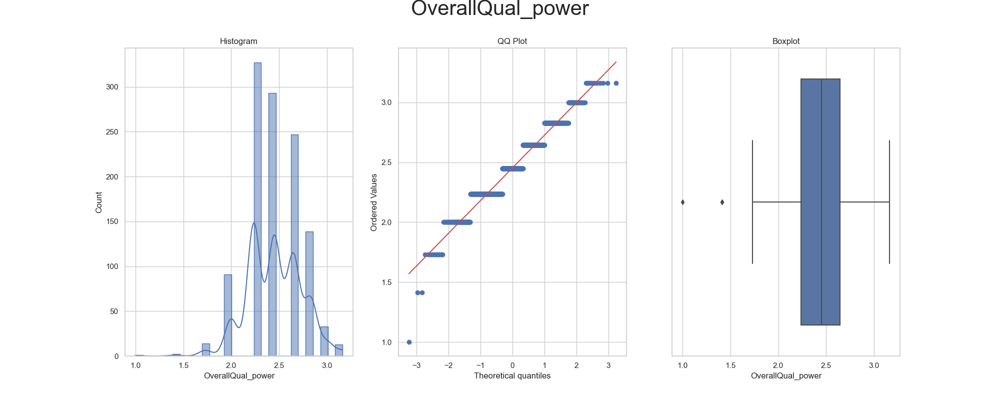

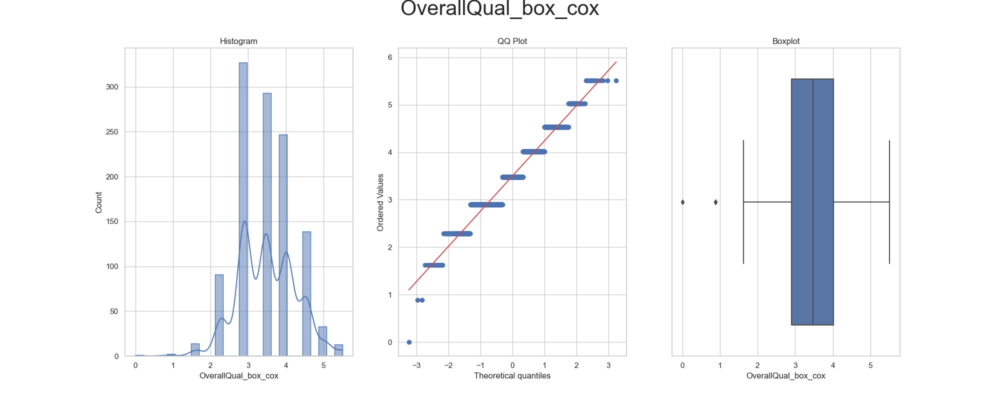

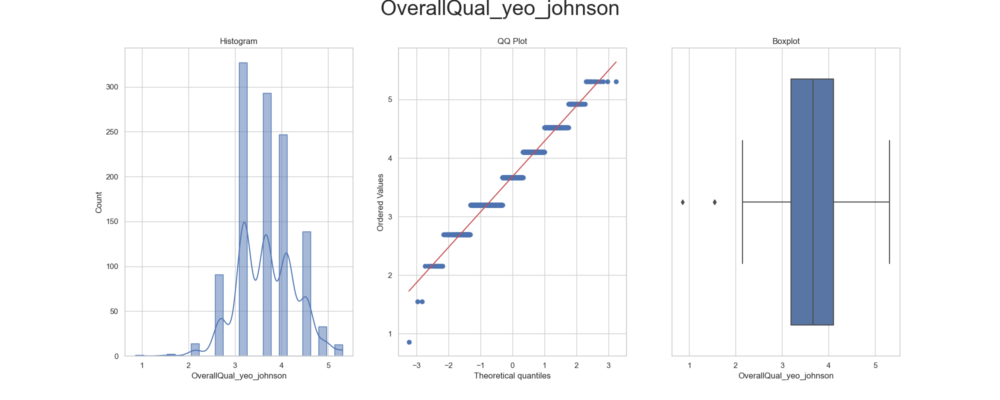



* Variable Analyzed: TotalBsmtSF
* Applied transformation: ['TotalBsmtSF_power', 'TotalBsmtSF_yeo_johnson'] 



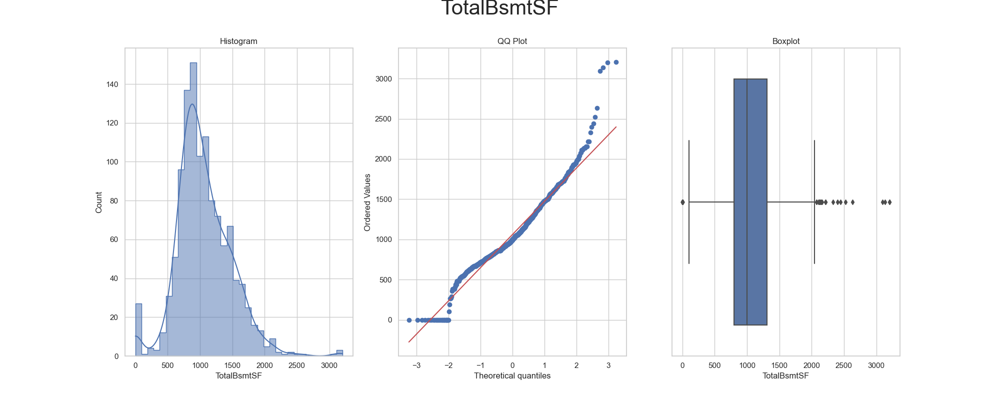

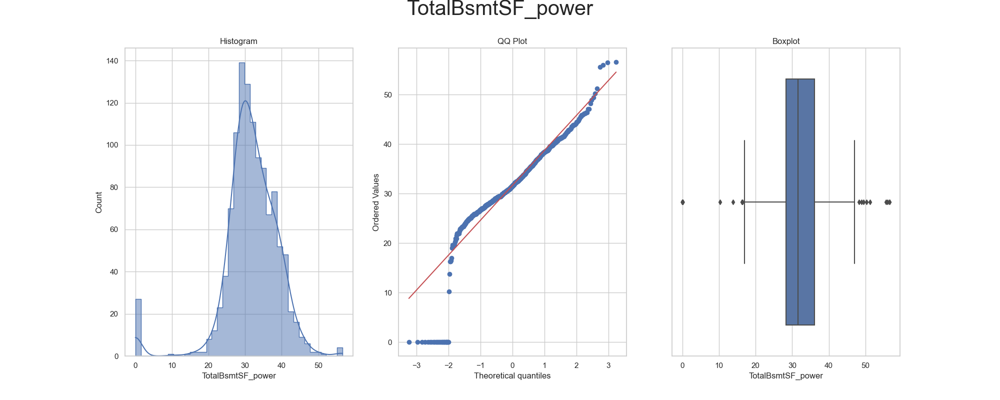

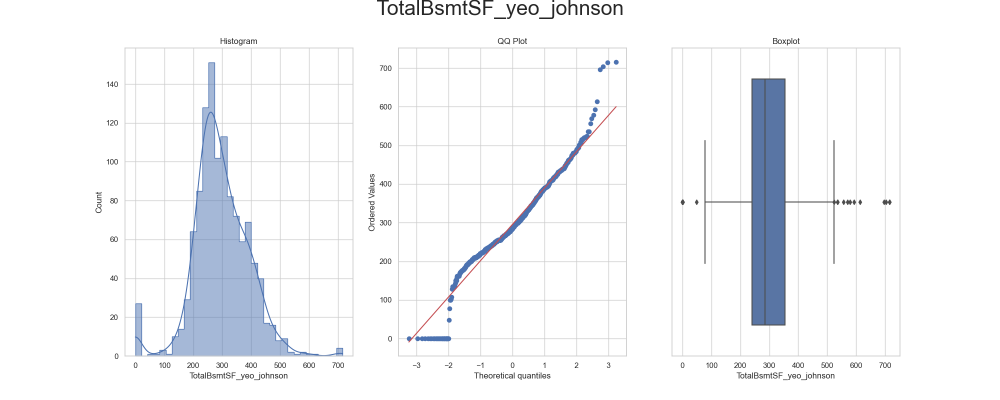



* Variable Analyzed: YearBuilt
* Applied transformation: ['YearBuilt_log_e', 'YearBuilt_log_10', 'YearBuilt_reciprocal', 'YearBuilt_power', 'YearBuilt_box_cox', 'YearBuilt_yeo_johnson'] 



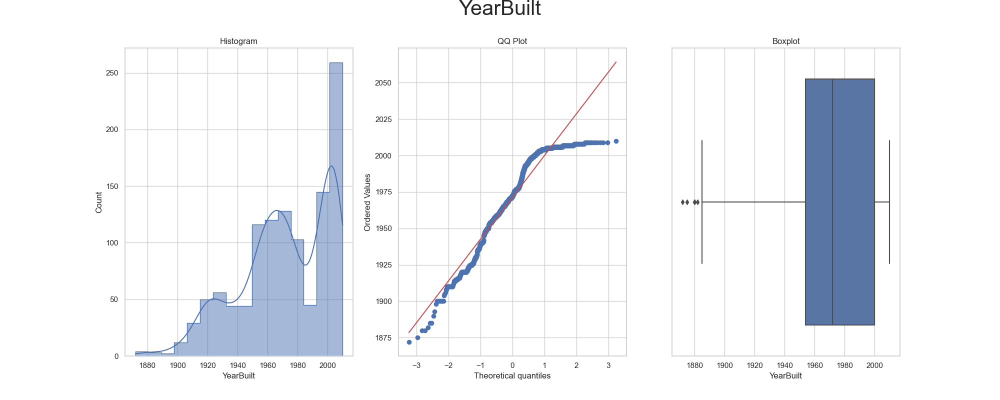

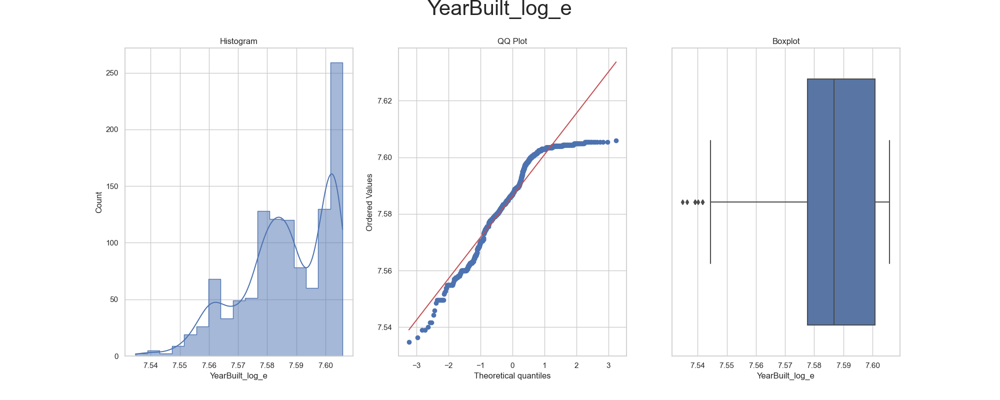

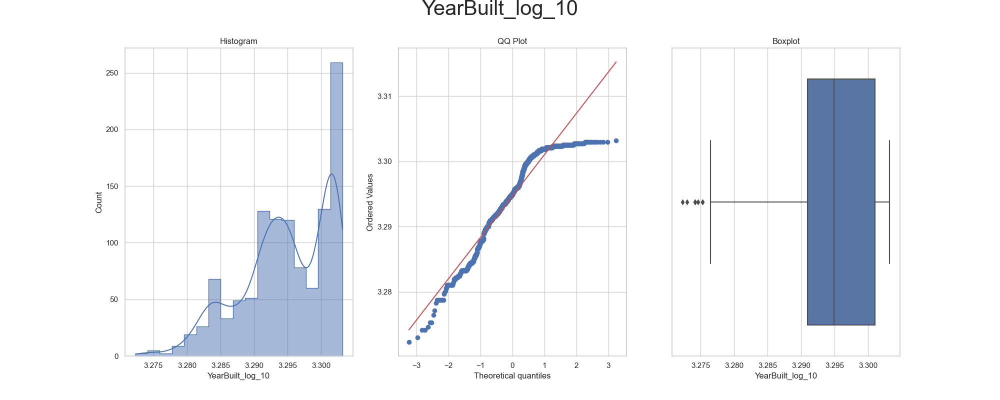

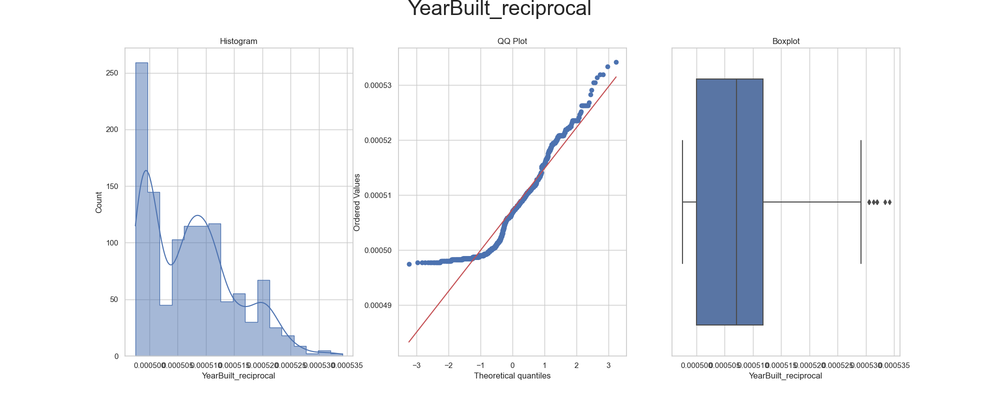

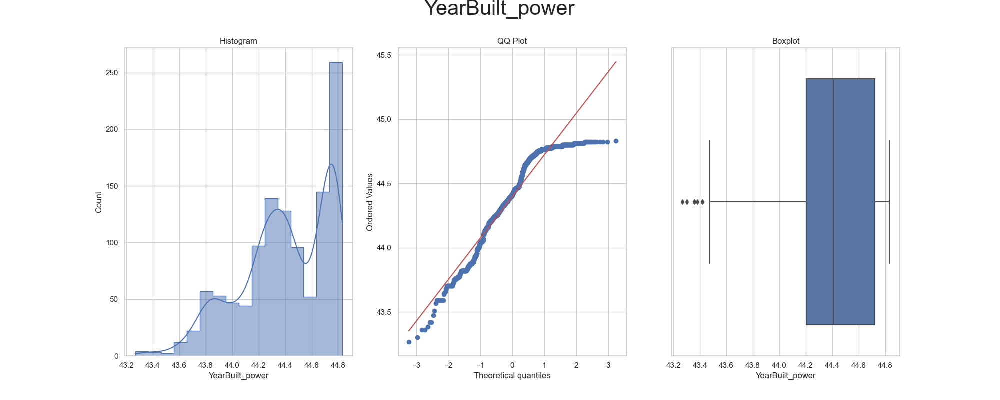

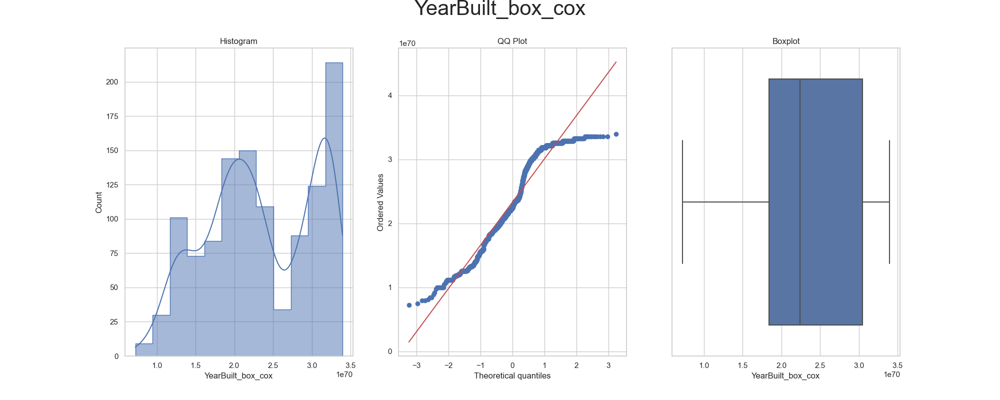

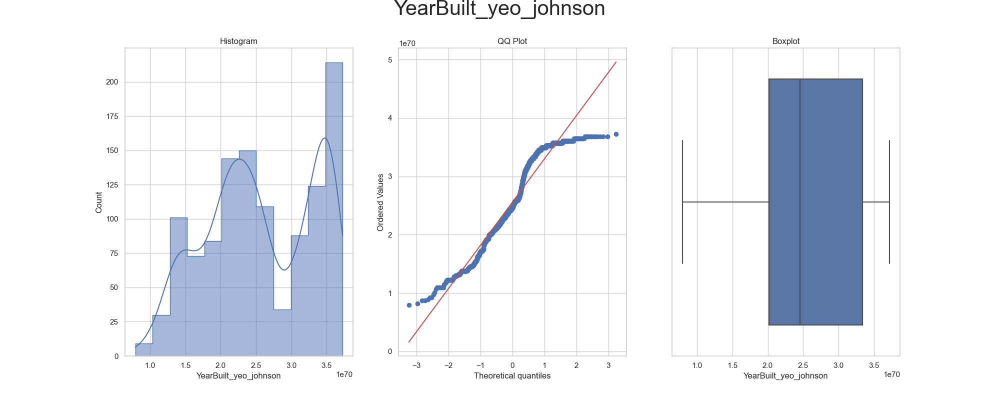



* Variable Analyzed: YearRemodAdd
* Applied transformation: ['YearRemodAdd_log_e', 'YearRemodAdd_log_10', 'YearRemodAdd_reciprocal', 'YearRemodAdd_power', 'YearRemodAdd_box_cox', 'YearRemodAdd_yeo_johnson'] 



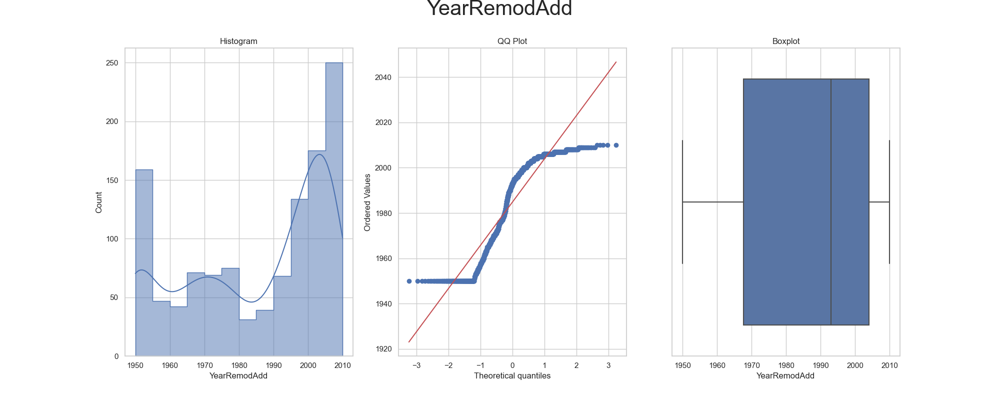

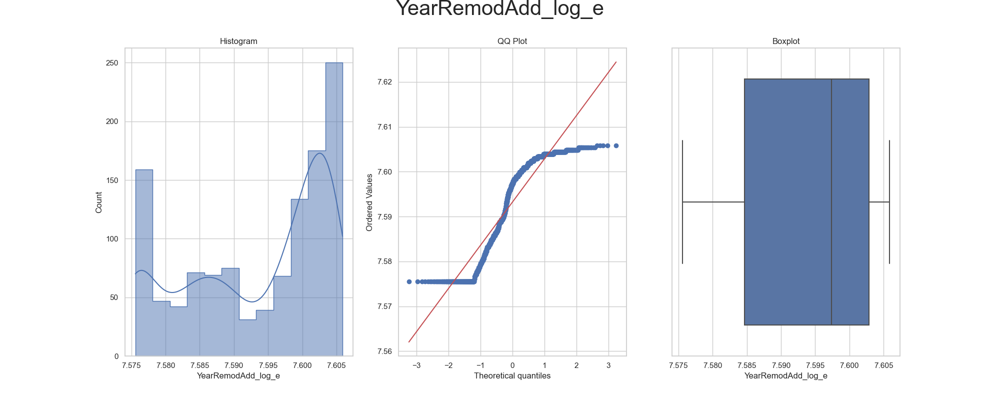

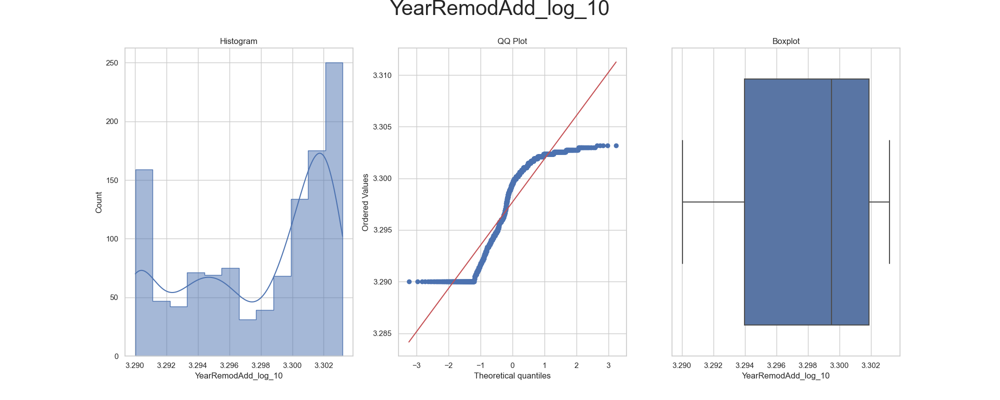

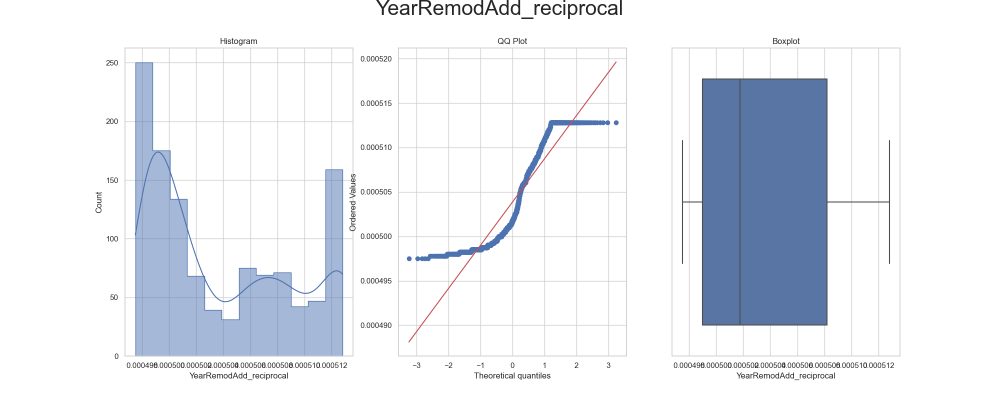

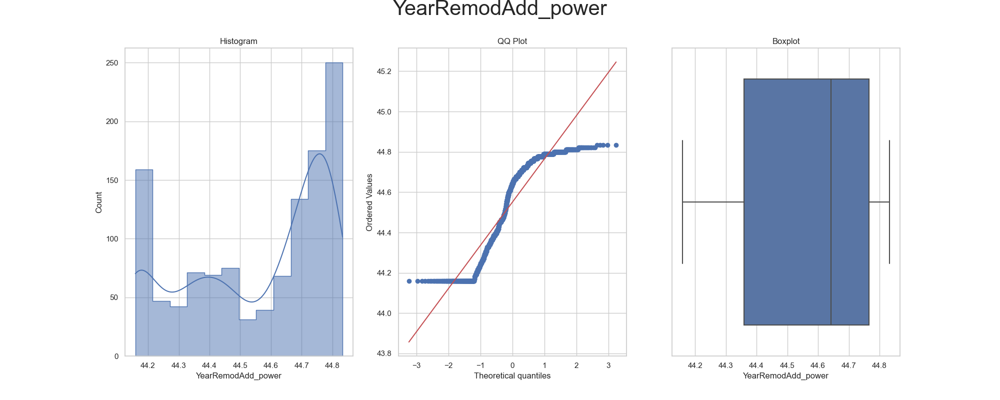

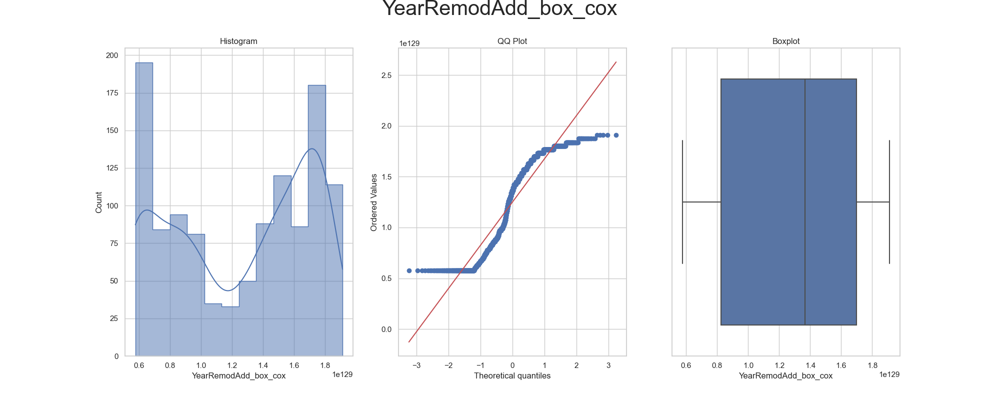

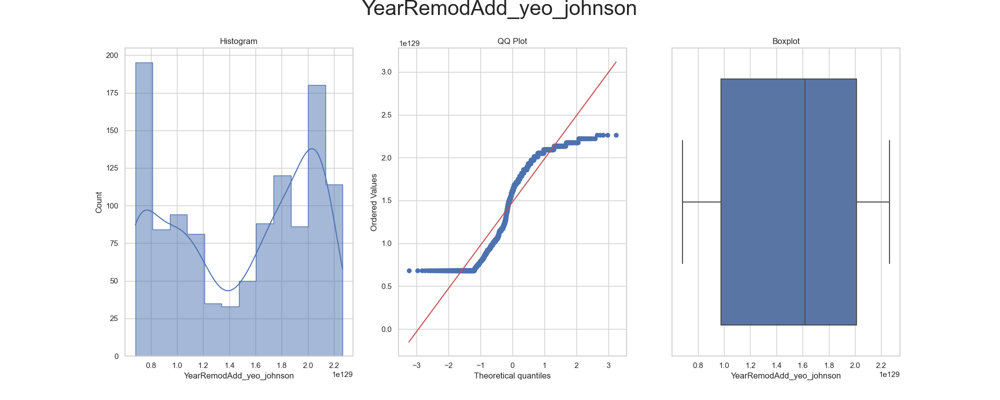



* Variable Analyzed: SalePrice
* Applied transformation: ['SalePrice_log_e', 'SalePrice_log_10', 'SalePrice_reciprocal', 'SalePrice_power', 'SalePrice_box_cox', 'SalePrice_yeo_johnson'] 



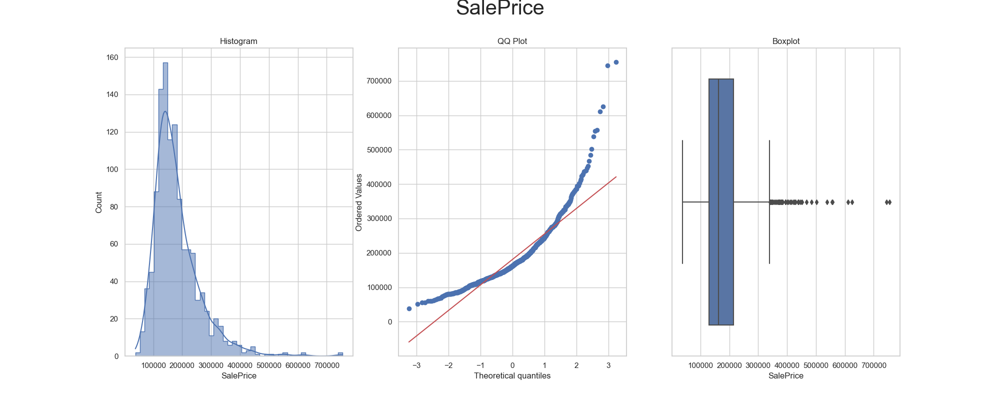

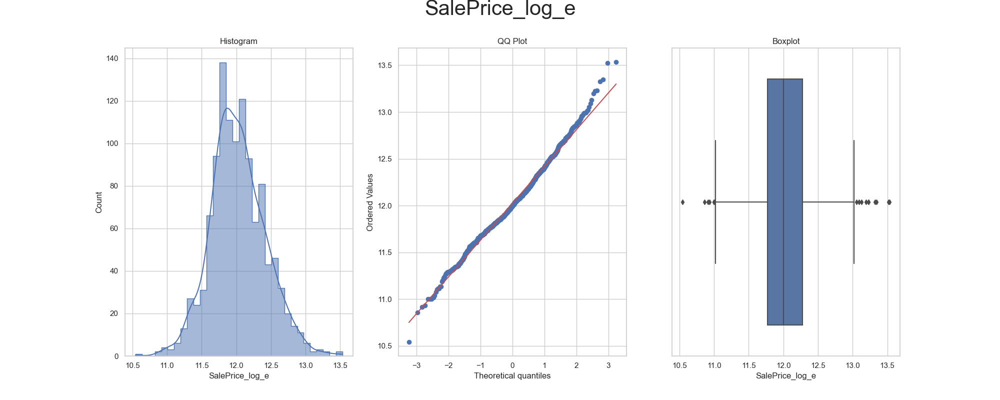

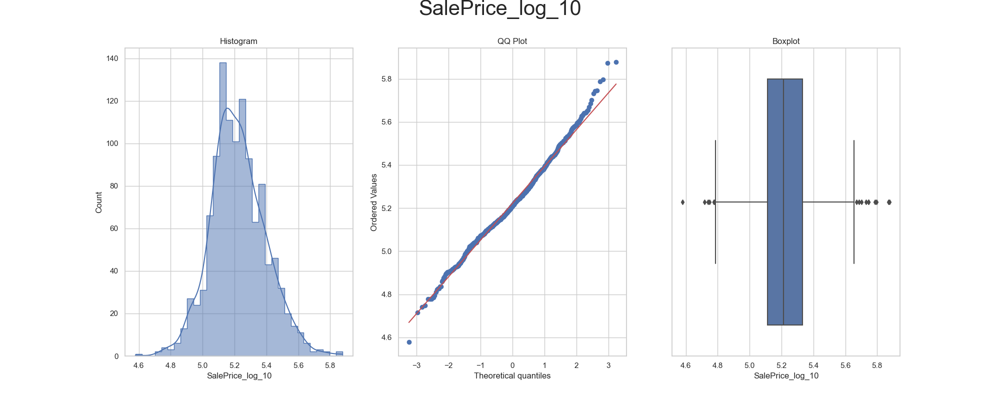

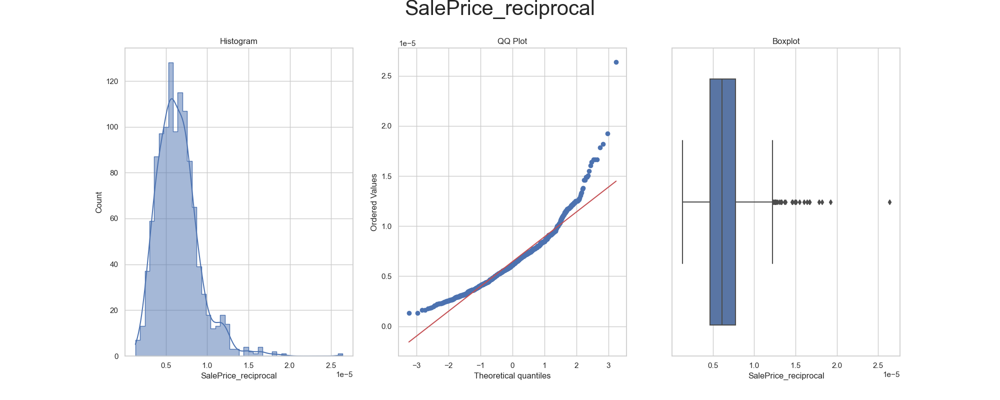

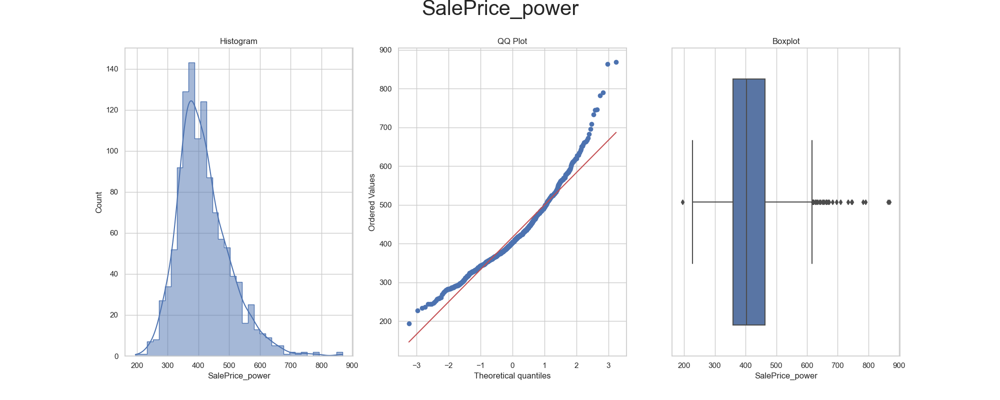

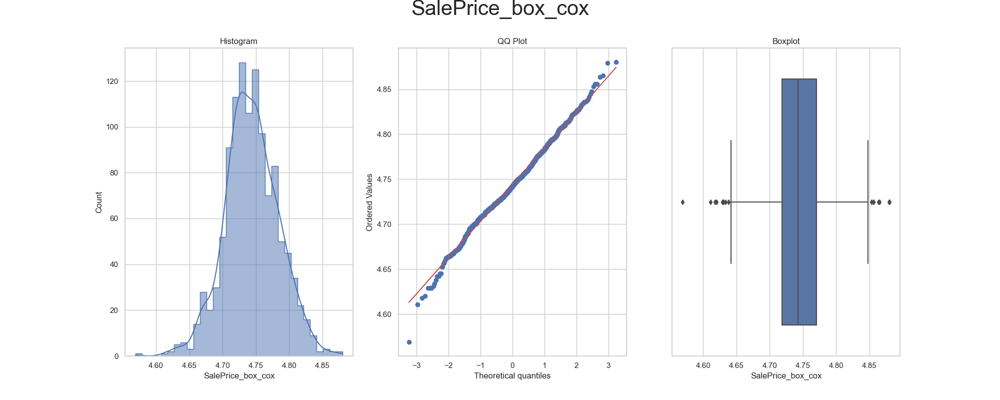

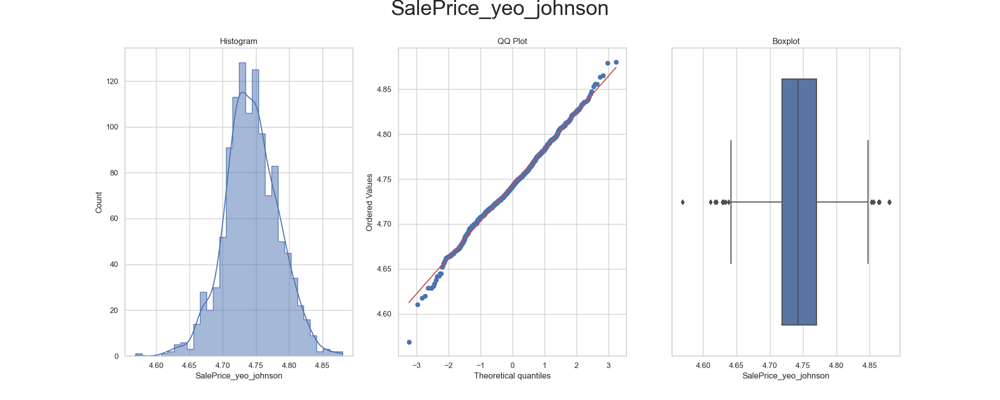

In [13]:
df_numerical_variables = FeatureEngineeringAnalysis(df=df_numerical_variables, analysis_type='numerical')

## Conclusions from feature engineering analysis
Based on the transformations applied to each variable, we can draw conclusions on their effectiveness:

* **KitchenQual**: This is the only categorical variable that is relevant to my analysis. I observed that the encoding assigned could be improved to resemble linearity and improve predictability for this feature. The encoding assigned ordinal values as follows:

**0 => TA**

**1 => Gd**

**2 => Fa**

**3 => Ex**


I would explore given more time how to apply instead the following encoding: 

**0 => Po**

**1 => Fa**

**2 => TA**

**3 => Gd**

**4 => Ex**

* **OverallQual**: The applied transformations do not seem to decrease the skewness of the variable by much, with the exception of the power transformation. This transformation appears to improve matters slightly. The non-transformed data displays a more gaussian distribution for this variable than for other variables. This is good because OverallQual seems to be the most important variable in the dataset. Lastly, it is clear that the reciprocal transformation yields negative results for this variable which would be an undesired effect.

* **GrLivArea**: Most of the transformations applied seem to decrease the skewness of the variable, resulting in a more Gaussian distribution. In contrast, both the power transformation and the reciprocal transformation display increased skewness and poor transformation in the plots.

* **GarageArea**: Most of the applied transformations do seem to decrease the skewness of the variable, resulting in a more Gaussian distribution. However, the reciprocal transformation evidently increases skewness displayed in each graph. 

* **Outliers**: For both GrLivArea and GarageArea it can be appreciated a number of outliers found in the dataset. Although logarithmic transformations will mitigate there negative effect, given more time we should consider addressing them directly in the dataset by either capping their value (assigning a maximum value based on multiples of standard deviation above the mean, for example) or removing those records all together from the dataset.